# Insurance Claim Fraud Detection Project.

In [1]:
#Importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Loading the dataset
df=pd.read_csv("Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [185]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [186]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [187]:
df.sample(15)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
964,163,37,390256,25-11-2009,IN,500/1000,1000,1200.33,4000000,477631,...,YES,3900,390,780,2730,Volkswagen,Jetta,2008,Y,NaN
100,269,41,797613,19-10-1990,IN,100/300,500,1463.82,0,448984,...,?,79300,15860,15860,47580,Saab,92x,2007,N,NaN
549,101,29,788502,31-08-2014,OH,250/500,500,1380.89,0,620197,...,?,67210,12220,12220,42770,BMW,X6,1996,N,NaN
83,200,35,960680,21-08-1994,IN,250/500,2000,1318.06,0,618498,...,YES,6490,1180,1180,4130,Volkswagen,Jetta,2002,N,NaN
398,6,27,463727,05-08-1992,OH,250/500,500,1075.71,0,604328,...,YES,3190,580,290,2320,Saab,95,2015,N,NaN
133,24,33,649082,19-01-1996,IL,500/1000,1000,1922.84,0,431277,...,NO,46800,4680,9360,32760,Jeep,Wrangler,2002,N,NaN
15,473,58,892874,19-10-1992,IN,100/300,2000,1131.40,0,458733,...,NO,63120,10520,10520,42080,Accura,MDX,1999,Y,NaN
509,126,30,267808,10-09-1998,IL,500/1000,2000,916.13,0,431389,...,NO,74160,6180,12360,55620,Mercedes,E400,2002,N,NaN
727,39,22,691115,28-01-1993,IN,500/1000,500,1173.21,0,431202,...,YES,86130,15660,7830,62640,Suburu,Legacy,2009,Y,NaN
250,117,28,336047,21-04-2003,OH,250/500,500,1264.77,0,447300,...,?,55440,5040,10080,40320,Suburu,Forrestor,2009,Y,NaN


In [188]:
df.shape

(1000, 40)

The dataset contains 1000 rows and 40 columns.

In [189]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [190]:
#To see columns in a list
df.columns.to_list()

['months_as_customer',
 'age',
 'policy_number',
 'policy_bind_date',
 'policy_state',
 'policy_csl',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'capital-gains',
 'capital-loss',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'property_damage',
 'bodily_injuries',
 'witnesses',
 'police_report_available',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_make',
 'auto_model',
 'auto_year',
 'fraud_reported',
 '_c39']

In [191]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [192]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

Out of 40 columns, 21 are categorical in nature and 19 are continous/numerical in nature.

#  Checking Duplicate Values

In [193]:
df.duplicated().sum()

0

In [194]:
df[df.duplicated()]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39


No duplicates found.

# Checking Null values

In [195]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In column '_c39' all are null values, so we will drop it.

In [196]:
#Dropping '_c39' column.
df.drop(['_c39'], axis=1, inplace = True)

In [197]:
df.shape

(1000, 39)

In [198]:
#checking again
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [199]:
#Checking for ?,-," " in our dataset.
df.isin(['?']).sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

We will replace those values with mode/median/mean.

In [200]:
#Replacing '?' with null values.
df.replace('?', np.NaN, inplace=True)

In [201]:
df.isnull().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

For coulmn 'police_report_available'

In [202]:
df['police_report_available'].unique()

array(['YES', nan, 'NO'], dtype=object)

In [203]:
df['police_report_available'].value_counts()

NO     343
YES    314
Name: police_report_available, dtype: int64

In [204]:
df['police_report_available'] = df['police_report_available'].fillna(df['police_report_available'].mode()[0])

In [205]:
df['police_report_available'].value_counts()

NO     686
YES    314
Name: police_report_available, dtype: int64

For coulmn 'property_damage'

In [206]:
df['property_damage'].unique()

array(['YES', nan, 'NO'], dtype=object)

In [207]:
df['property_damage'].value_counts()

NO     338
YES    302
Name: property_damage, dtype: int64

In [208]:
df['property_damage'] = df['property_damage'].fillna(df['property_damage'].mode()[0])

In [209]:
df['property_damage'].value_counts()

NO     698
YES    302
Name: property_damage, dtype: int64

For coulmn 'collision_type'

In [210]:
df['collision_type'].unique()

array(['Side Collision', nan, 'Rear Collision', 'Front Collision'],
      dtype=object)

In [211]:
df['collision_type'].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64

In [212]:
df['collision_type'] = df['collision_type'].fillna(df['collision_type'].mode()[0])

In [213]:
df['collision_type'].value_counts()

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64

In [214]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

<Axes: >

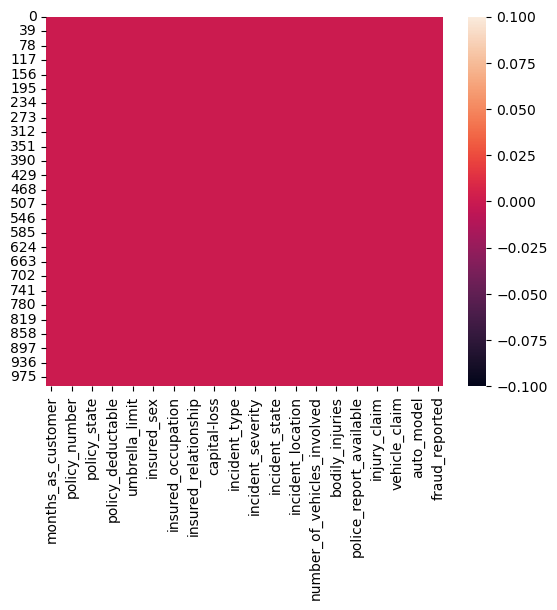

In [215]:
#To see in a heatmap
sns.heatmap(df.isnull())

Here, we can see that no null values present.

# Data Exploration

In [216]:
#Ckecking the values for categorical column.
for i in df.columns:
    if(df[i].dtype==object):
        print(i,"\n")
        print(df[i].value_counts(),"\n")

policy_bind_date 

01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64 

policy_state 

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64 

policy_csl 

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64 

insured_sex 

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64 

insured_education_level 

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64 

insured_occupation 

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-se

In [217]:
#Checking No. of Unique values of 'incident_location'
df['incident_location'].nunique()

1000

The column 'incident_location' has 1000 unique values, so will not have any impact in predicting our target variable. Hence, we will drop it.

In [218]:
df.drop(['incident_location'], axis=1,inplace = True)

In [219]:
df.shape

(1000, 38)

Converting Date Column to Datetime.

In [220]:
# Converting Date columns from object type into datetime
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

In [221]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   int64         
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   object        
 5   policy_csl                   1000 non-null   object        
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   int64         
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   object        
 11  insured_education_level      1000 non-null  

In [222]:
# Extracting Day, Month and Year column from policy_bind_date
df['policy_bind_day'] = df['policy_bind_date'].dt.day
df['policy_bind_month'] = df['policy_bind_date'].dt.month
df['policy_bind_year'] = df['policy_bind_date'].dt.year

# Extracting Day, Month and Year column from incident_date
df['incident_day'] = df['incident_date'].dt.day
df['incident_month'] = df['incident_date'].dt.month
df['incident_year'] = df['incident_date'].dt.year

In [223]:
#Now dropping those date columns.
df.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)

In [224]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_state                 1000 non-null   object 
 4   policy_csl                   1000 non-null   object 
 5   policy_deductable            1000 non-null   int64  
 6   policy_annual_premium        1000 non-null   float64
 7   umbrella_limit               1000 non-null   int64  
 8   insured_zip                  1000 non-null   int64  
 9   insured_sex                  1000 non-null   object 
 10  insured_education_level      1000 non-null   object 
 11  insured_occupation           1000 non-null   object 
 12  insured_hobbies              1000 non-null   object 
 13  insured_relationshi

In [225]:
df.shape

(1000, 42)

In [226]:
#Ckecking the values for numerical column.
for i in df.columns:
    if(df[i].dtype!=object):
        print(i,"\n")
        print(df[i].value_counts(),"\n")

months_as_customer 

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64 

age 

43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64 

policy_number 

521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64 

policy_deductable 

1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64 

policy_annual_premium 

1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13   

In [227]:
#Checking No of Unique values of 'incident_year'
df['incident_year'].nunique()

1

In [228]:
#Since incident_year is same for all datas, so we will drop it.
df.drop(columns=['incident_year'],axis=1,inplace=True)

In [229]:
#Checking No of Unique values of 'policy_number'
df['policy_number'].nunique()

1000

In [230]:
#Checking No. of Unique values of 'insured_zip'
df['insured_zip'].nunique()

995

From the above values, we can see that column 'policy_number' has 1000 unique values and column 'insured_zip' has 995 unique values. So, it will have any say in predicting the target variable. 

In [231]:
#Dropping those unnecessary columns
df.drop(columns=['policy_number', 'insured_zip'],axis=1,inplace=True)

In [232]:
df.shape

(1000, 39)

In [233]:
#statisdical summary of numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,2.039540e+02,1.151132e+02,0.00,115.7500,199.5,276.250,479.00
age,1000.0,3.894800e+01,9.140287e+00,19.00,32.0000,38.0,44.000,64.00
policy_deductable,1000.0,1.136000e+03,6.118647e+02,500.00,500.0000,1000.0,2000.000,2000.00
policy_annual_premium,1000.0,1.256406e+03,2.441674e+02,433.33,1089.6075,1257.2,1415.695,2047.59
umbrella_limit,1000.0,1.101000e+06,2.297407e+06,-1000000.00,0.0000,0.0,0.000,10000000.00
capital-gains,1000.0,2.512610e+04,2.787219e+04,0.00,0.0000,0.0,51025.000,100500.00
capital-loss,1000.0,-2.679370e+04,2.810410e+04,-111100.00,-51500.0000,-23250.0,0.000,0.00
incident_hour_of_the_day,1000.0,1.164400e+01,6.951373e+00,0.00,6.0000,12.0,17.000,23.00
number_of_vehicles_involved,1000.0,1.839000e+00,1.018880e+00,1.00,1.0000,1.0,3.000,4.00
bodily_injuries,1000.0,9.920000e-01,8.201272e-01,0.00,0.0000,1.0,2.000,2.00


From the above, we can see that,
 
    1.The dataset looks perfect because it did not have any negative/invalid datas
    2.The counts are same, so missing/null values
    3.The mean and median(50%) have differences, so skewness is present.
    4.There is also huge difference between 75% and max in some columns,so outliers are present.

Now, we will go for Data Visualization.

# Data Visualization

Univariant Analysis

N    753
Y    247
Name: fraud_reported, dtype: int64


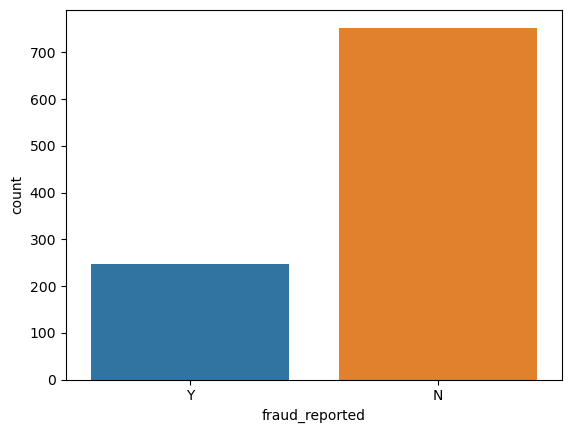

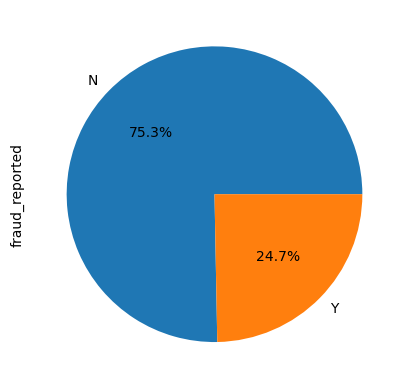

In [234]:
print(df['fraud_reported'].value_counts())
sns.countplot(x='fraud_reported', data =df)
plt.show()
df['fraud_reported'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

In our dataset, nearly 25% of Insuruance claim are Fraud.

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


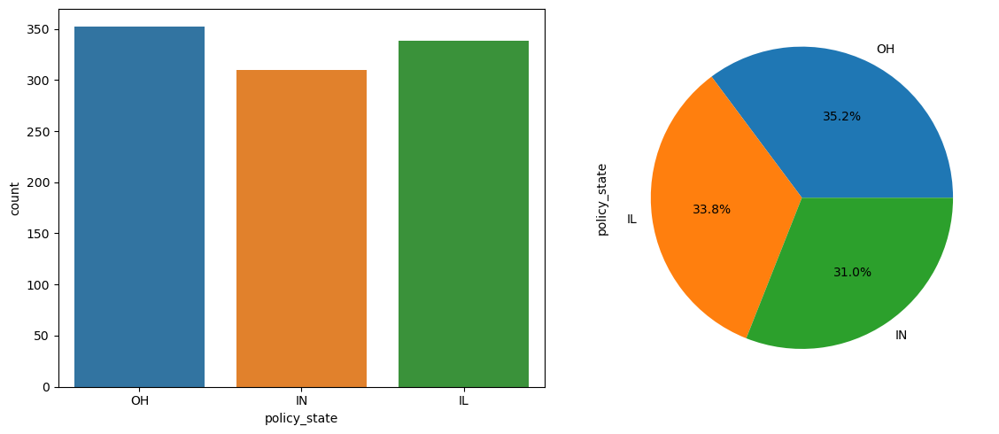

In [235]:
print(df['policy_state'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='policy_state', data=df, ax=axes[0])
df['policy_state'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Insurance claims from three states are almost equal.

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


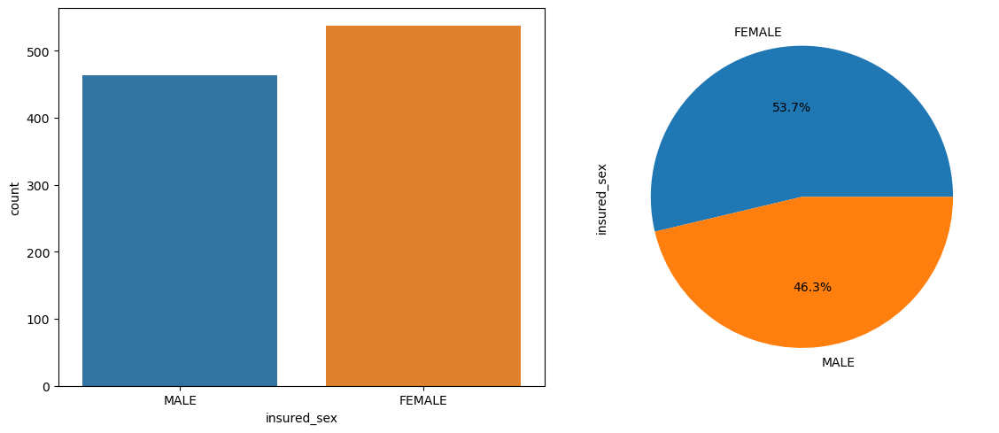

In [236]:
print(df['insured_sex'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='insured_sex', data=df, ax=axes[0])
df['insured_sex'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Slightly more females have calimed their insurance when compared to males.

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


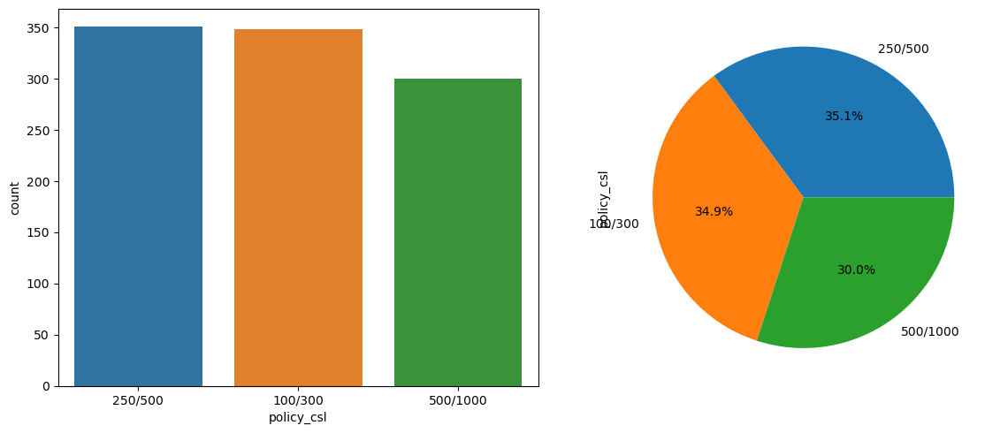

In [237]:
print(df['policy_csl'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='policy_csl', data=df, ax=axes[0])
df['policy_csl'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

More people have 250/500  and 100/300  policy_csl.

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


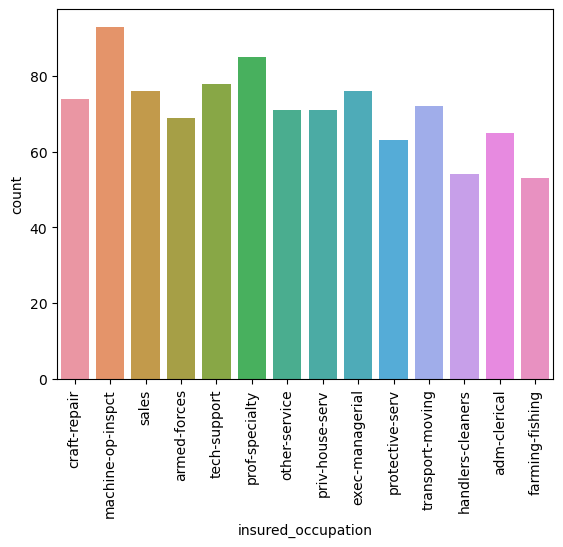

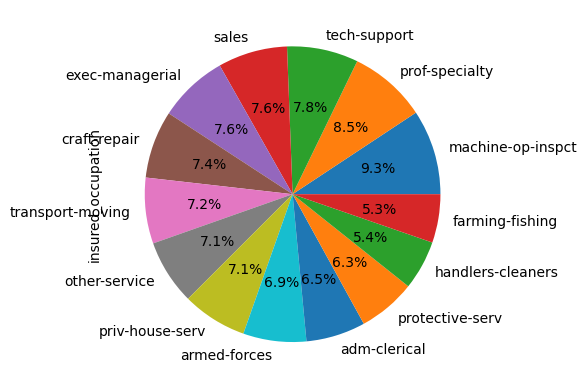

In [238]:
print(df['insured_occupation'].value_counts())
sns.countplot(x='insured_occupation', data =df)
plt.xticks(rotation=90)
plt.show()
df['insured_occupation'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

People from various occupation claimed their insurance.

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


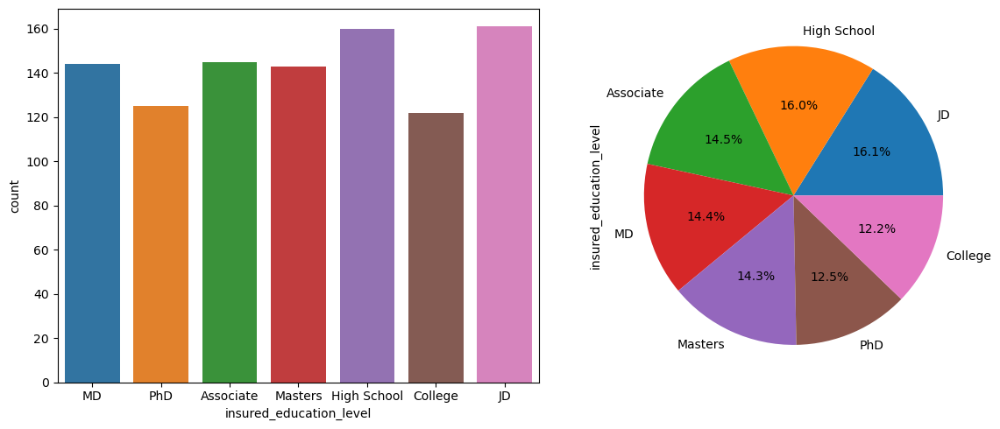

In [239]:
print(df['insured_education_level'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='insured_education_level', data=df, ax=axes[0])
df['insured_education_level'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

People who are having JD and High school education have more claims.

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


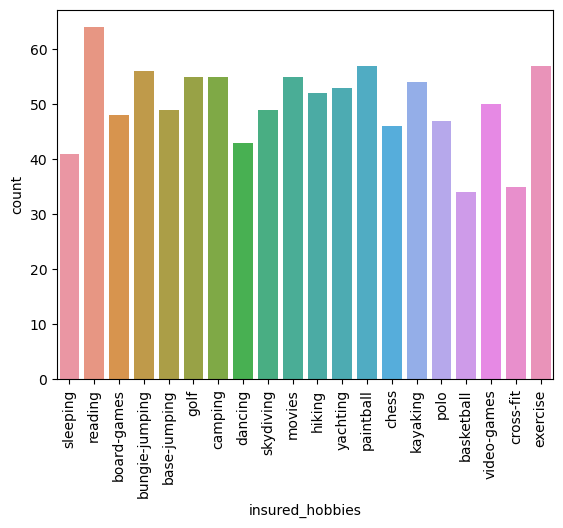

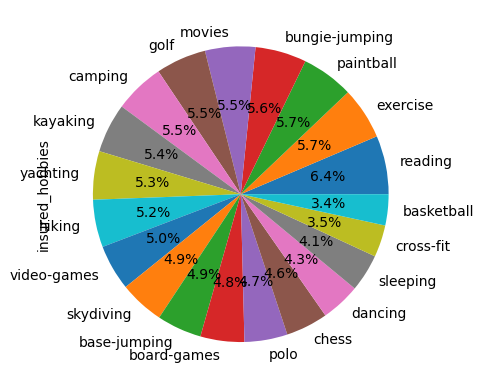

In [240]:
print(df['insured_hobbies'].value_counts())
sns.countplot(x='insured_hobbies', data =df)
plt.xticks(rotation=90)
plt.show()
df['insured_hobbies'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

People are having various kinds if hobbies, out of that Reading is more prevalent.

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


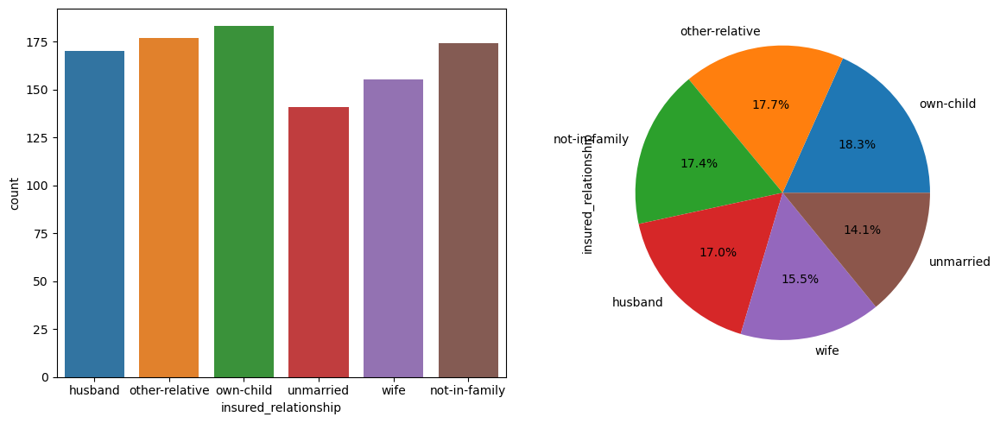

In [241]:
print(df['insured_relationship'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='insured_relationship', data=df, ax=axes[0])
df['insured_relationship'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


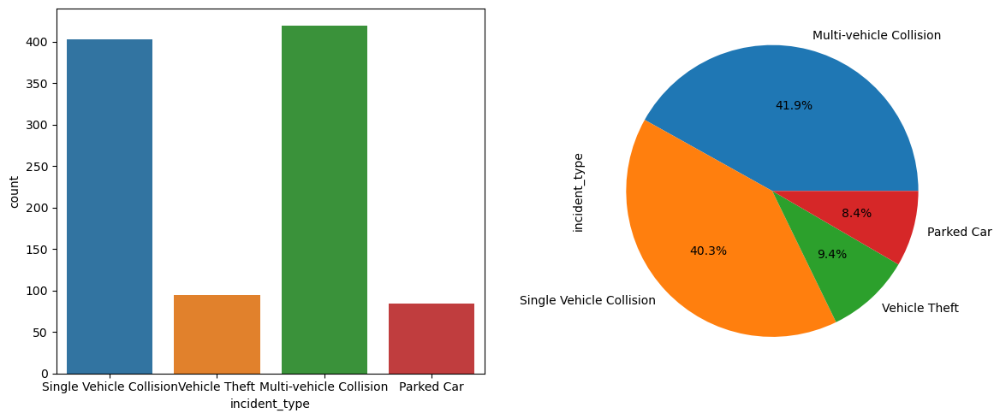

In [242]:
print(df['incident_type'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='incident_type', data=df, ax=axes[0])
df['incident_type'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

In incident type, Multi-vehicle Collision and Single Vehicle Collision comprises of 80%.

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


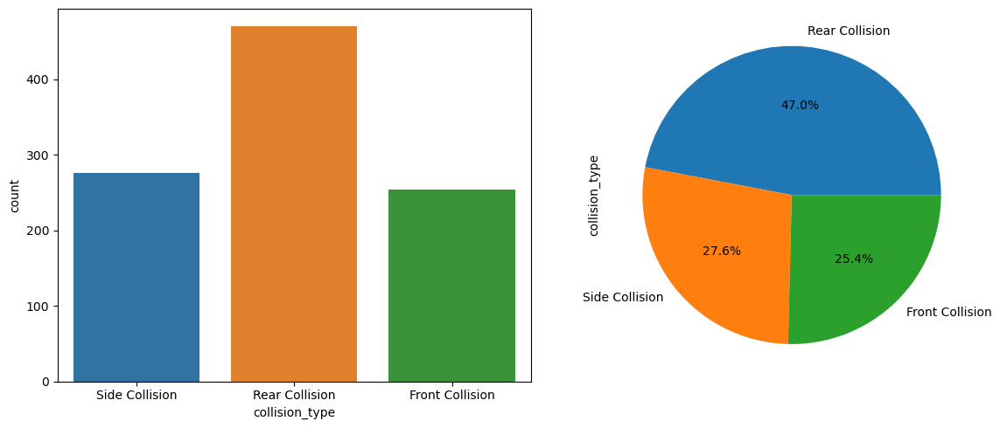

In [243]:
print(df['collision_type'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='collision_type', data=df, ax=axes[0])
df['collision_type'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Nearly 47% of Collistion type are Rear collision.

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


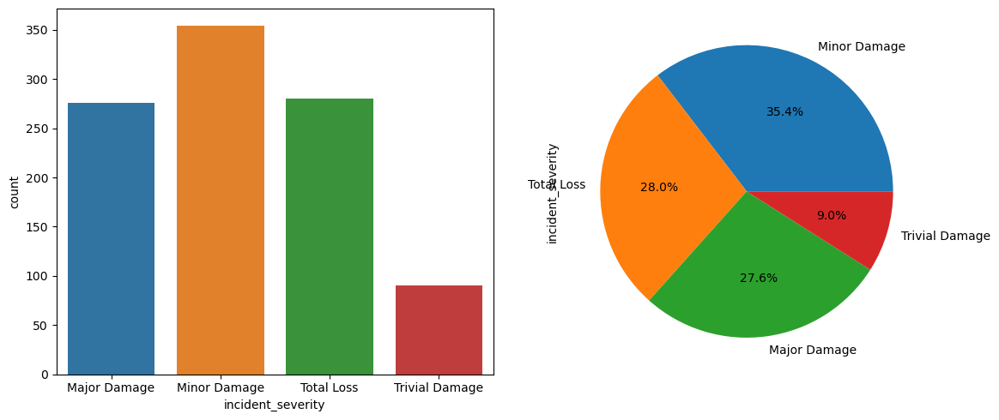

In [244]:
print(df['incident_severity'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='incident_severity', data=df, ax=axes[0])
df['incident_severity'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Incident_severity mainly 35.4% are Minor Damage, 28% are Total Loss and 27.6% are Major Damage.

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


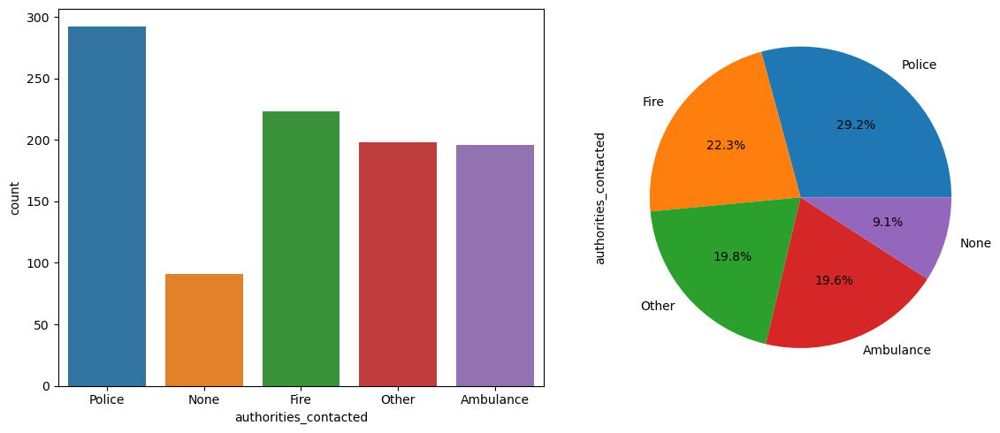

In [245]:
print(df['authorities_contacted'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='authorities_contacted', data=df, ax=axes[0])
df['authorities_contacted'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Most of the times police are contacted and next is Fire dept.

NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


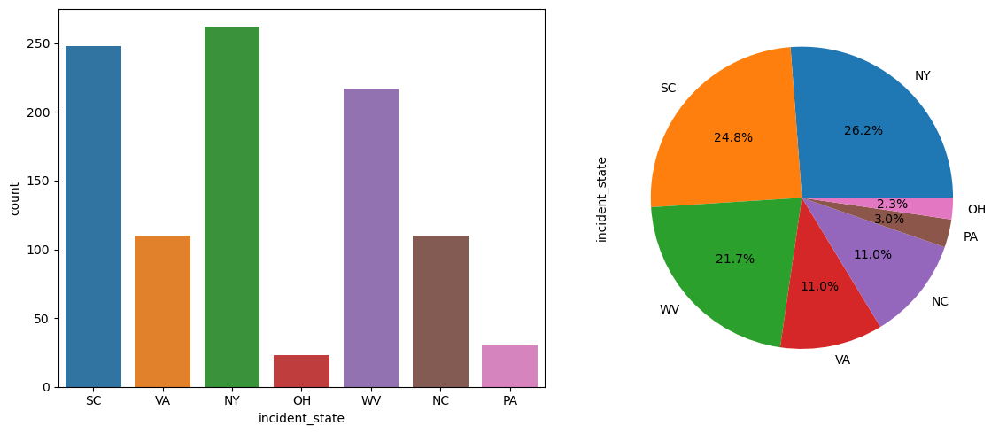

In [246]:
print(df['incident_state'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='incident_state', data=df, ax=axes[0])
df['incident_state'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Mainly incidents happens in 3 states which are 'NY', 'SC' and 'WV'.

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


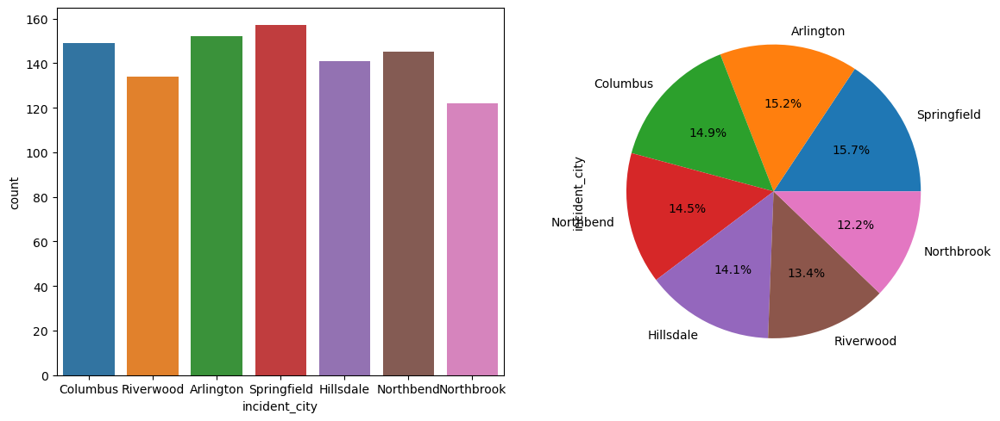

In [3]:
print(df['incident_city'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='incident_city', data=df, ax=axes[0])
df['incident_city'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Out of all Incident cities, Springfield have the highest incidents.

1    581
3    358
4     31
2     30
Name: number_of_vehicles_involved, dtype: int64


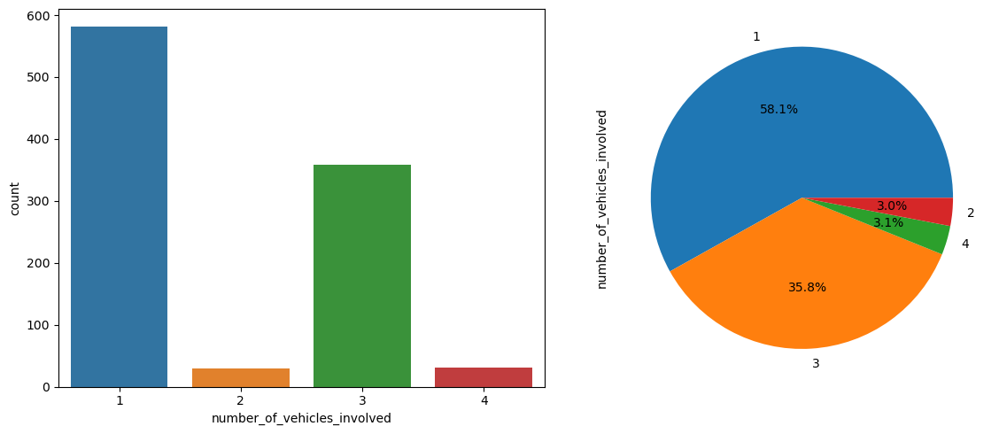

In [248]:
print(df['number_of_vehicles_involved'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='number_of_vehicles_involved', data=df, ax=axes[0])
df['number_of_vehicles_involved'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Most of times number_of_vehicles_involved are 1 and 3.

NO     698
YES    302
Name: property_damage, dtype: int64


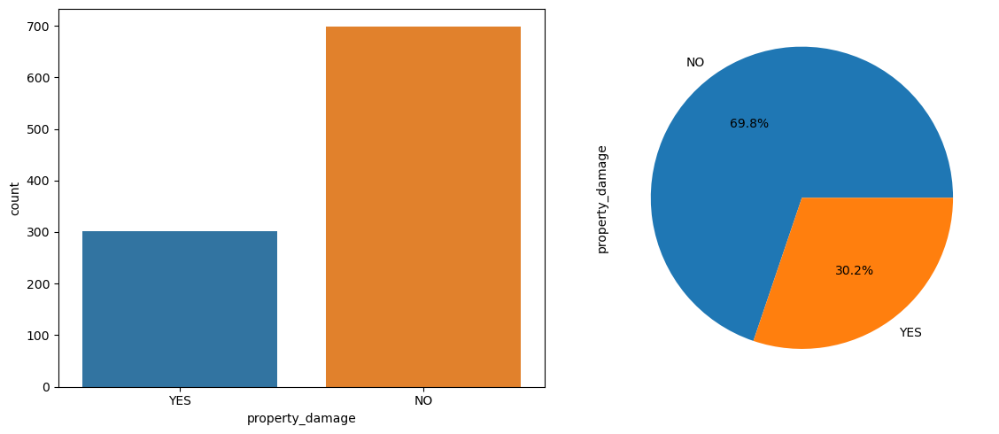

In [250]:
print(df['property_damage'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='property_damage', data=df, ax=axes[0])
df['property_damage'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Nearly 70% of the times there is no property damage.

0    340
2    332
1    328
Name: bodily_injuries, dtype: int64


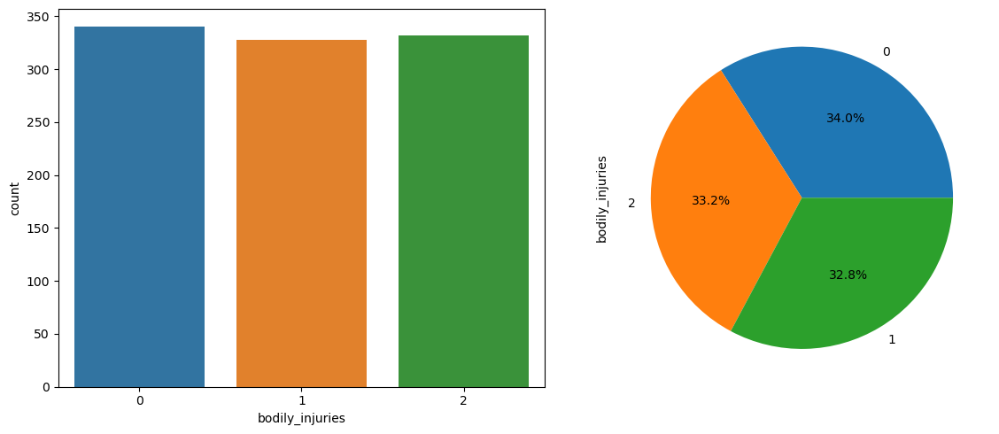

In [251]:
print(df['bodily_injuries'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='bodily_injuries', data=df, ax=axes[0])
df['bodily_injuries'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

34% of the times no one is injured, 33% of the times 2 persons are injured and 32% of the times one person is injured. 

1    258
2    250
0    249
3    243
Name: witnesses, dtype: int64


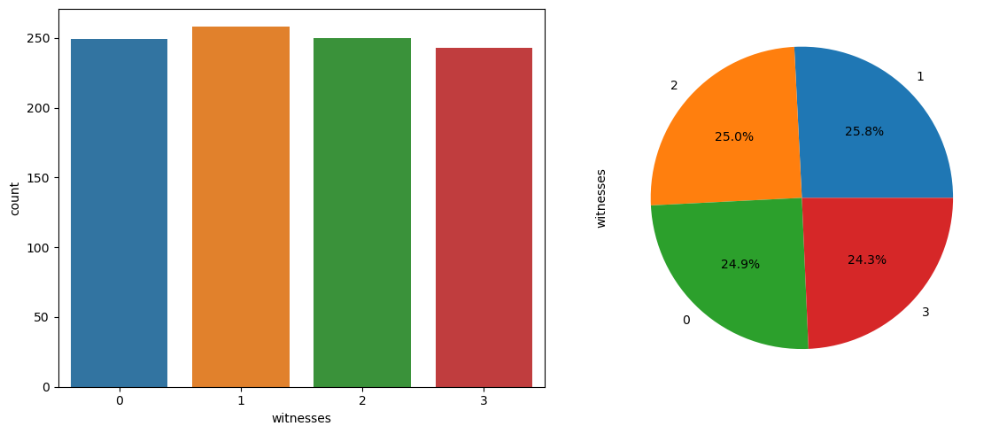

In [252]:
print(df['witnesses'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='witnesses', data=df, ax=axes[0])
df['witnesses'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Minimum of Zero witnesses and maximum of 3 witnesses are there when the incidents happened.

NO     686
YES    314
Name: police_report_available, dtype: int64


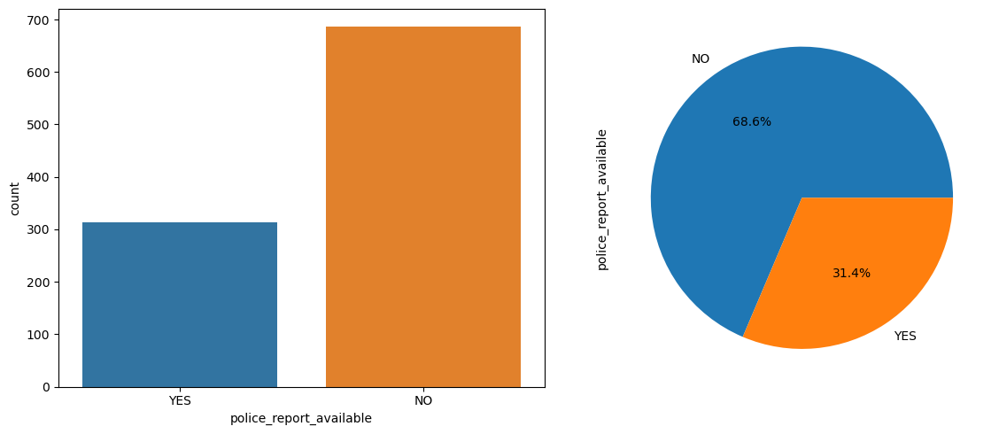

In [253]:
print(df['police_report_available'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='police_report_available', data=df, ax=axes[0])
df['police_report_available'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

For most of the incidents(nearly 70%) there is no police report available.

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


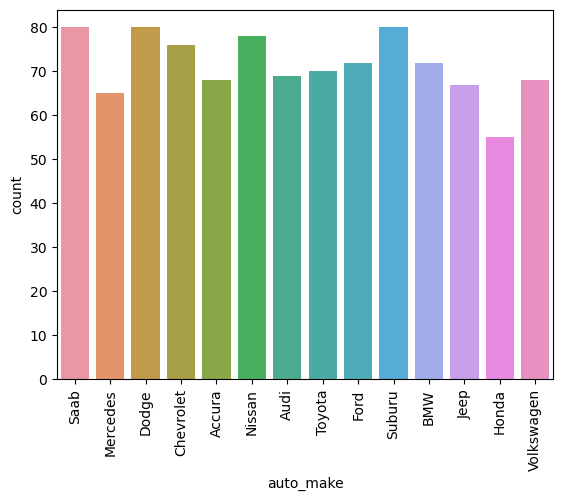

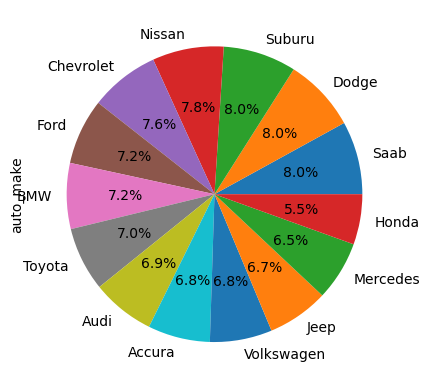

In [254]:
print(df['auto_make'].value_counts())
sns.countplot(x='auto_make', data =df)
plt.xticks(rotation=90)
plt.show()
df['auto_make'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


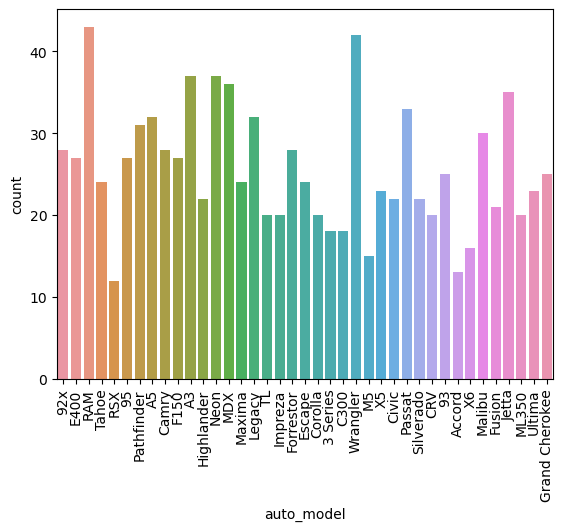

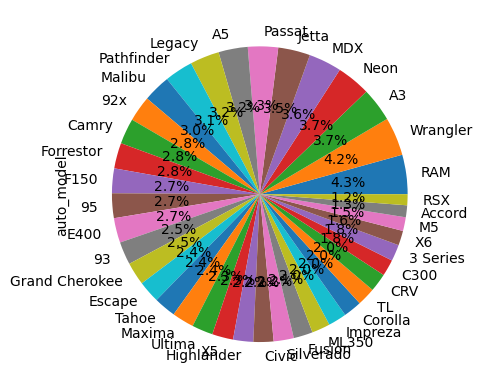

In [255]:
print(df['auto_model'].value_counts())
sns.countplot(x='auto_model', data =df)
plt.xticks(rotation=90)
plt.show()
df['auto_model'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

1995    56
1999    55
2005    54
2006    53
2011    53
2007    52
2003    51
2009    50
2010    50
2013    49
2002    49
2015    47
1997    46
2012    46
2008    45
2014    44
2001    42
2000    42
1998    40
2004    39
1996    37
Name: auto_year, dtype: int64


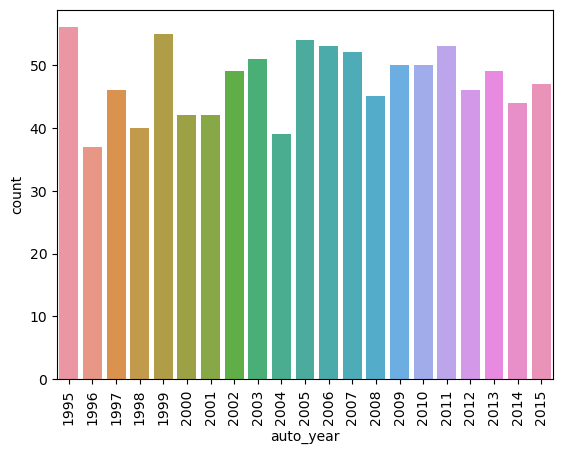

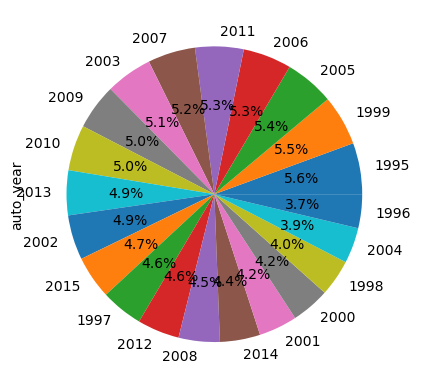

In [256]:
print(df['auto_year'].value_counts())
sns.countplot(x='auto_year', data =df)
plt.xticks(rotation=90)
plt.show()
df['auto_year'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.show()

1     365
2     312
8      39
12     39
6      37
4      36
7      35
10     34
3      31
9      30
5      23
11     19
Name: incident_month, dtype: int64


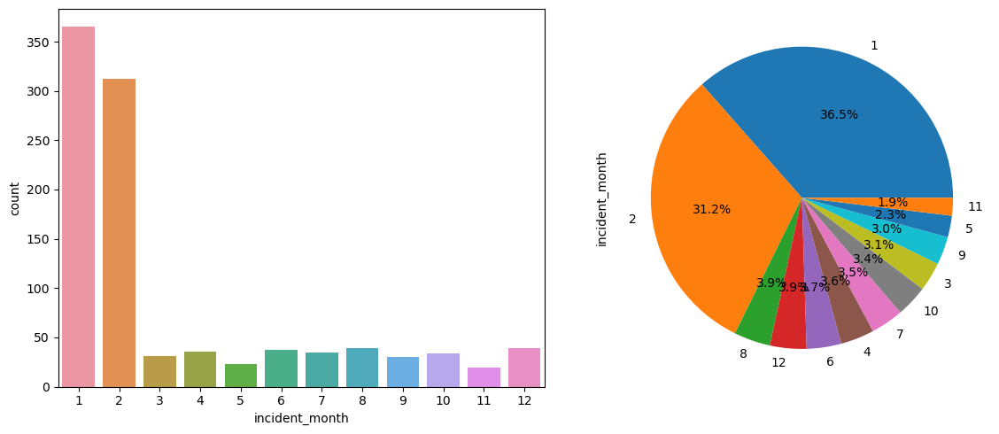

In [257]:
print(df['incident_month'].value_counts())
fig, axes = plt.subplots(1, 2, figsize=(12,5))
sns.countplot(x='incident_month', data=df, ax=axes[0])
df['incident_month'].value_counts().plot(kind="pie", autopct="%0.1f%%")
plt.tight_layout()
plt.show()

Most of the incidents happened in the First and Second month of the year 2015.

To see for numerical columns:

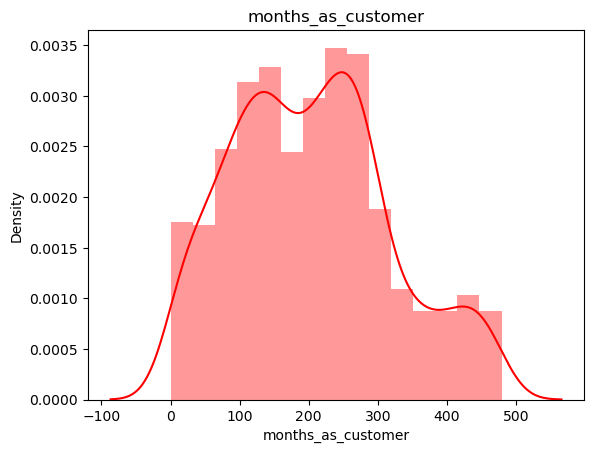

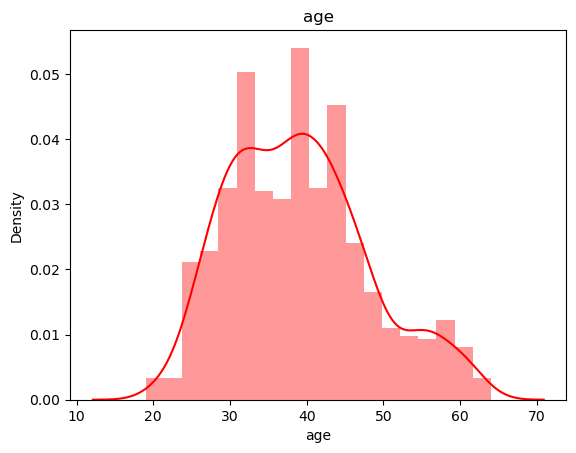

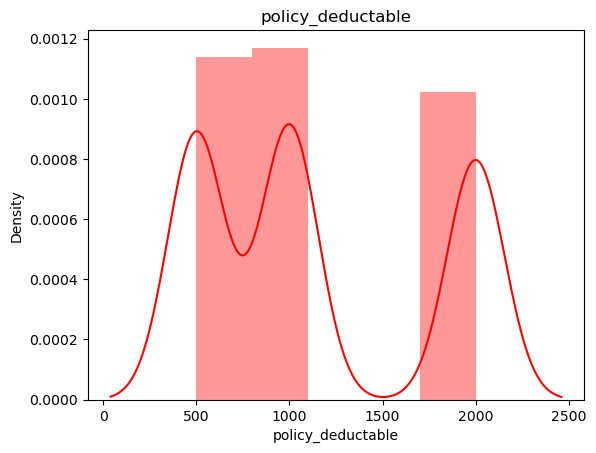

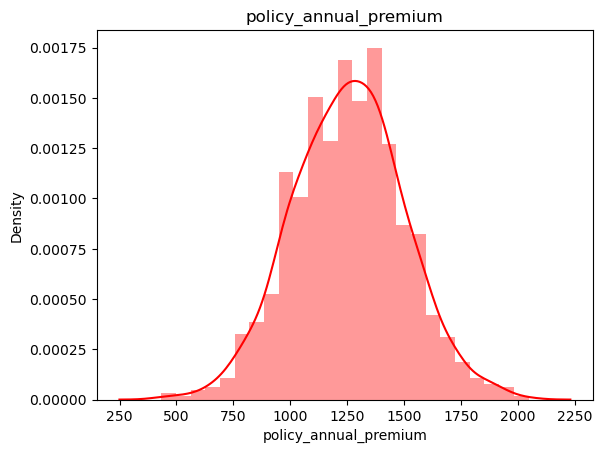

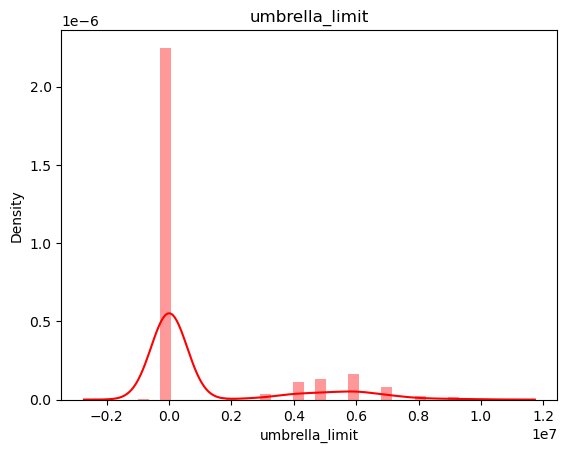

...

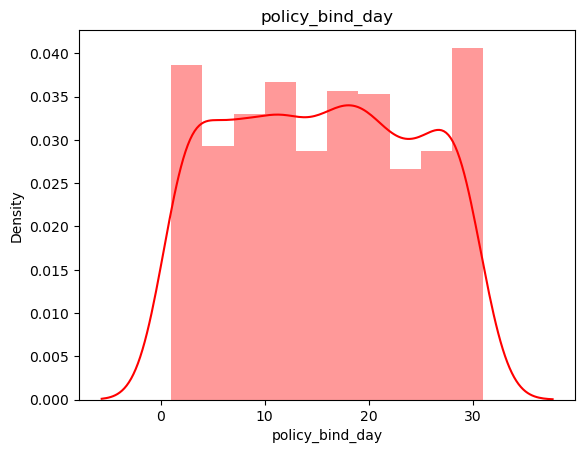

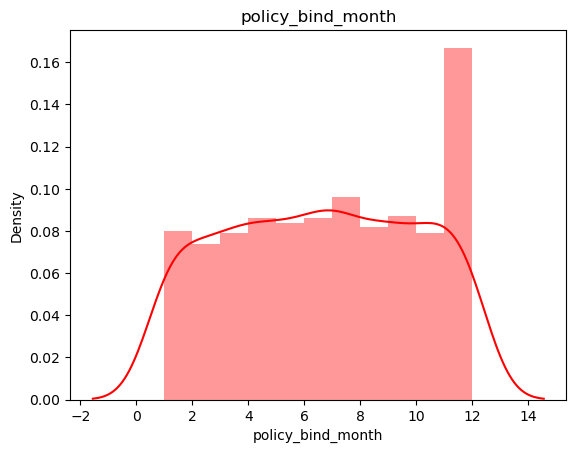

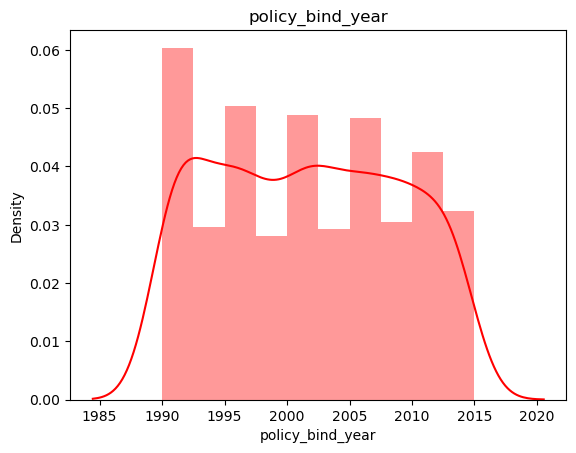

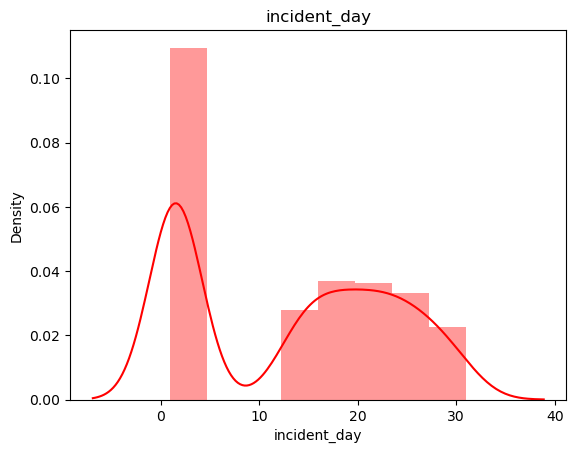

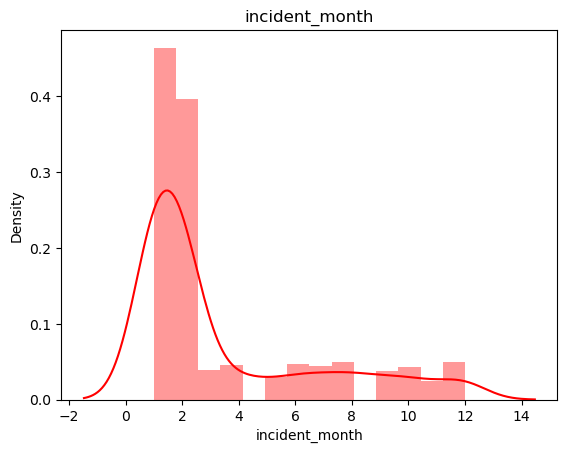

In [258]:
for i in df.columns :
    if df[i].dtypes!=object:
        sns.distplot(df[i] , kde = True , color = 'red' )
        plt.title(i)
        plt.show()

Fom the above graphs, we can see that
    
    1) The columns 'umbrella_limit', 'capital-gains', 'total_claim_amount','injury_claim', 'property_claim', 'vehicle_claim' and 'incident_month' have right side skewness.
    2) The column 'capital-loss' have left side skewness.

Bivariant Analysis

<Axes: xlabel='fraud_reported', ylabel='count'>

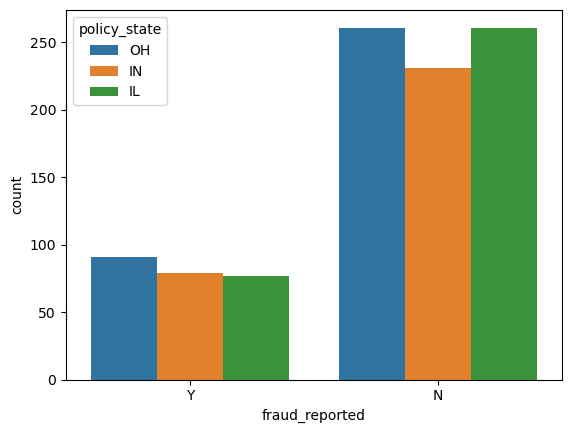

In [259]:
sns.countplot(x='fraud_reported',hue='policy_state',data=df)

Out of the three states 'OH' have the highest fraud claim.

<Axes: xlabel='fraud_reported', ylabel='count'>

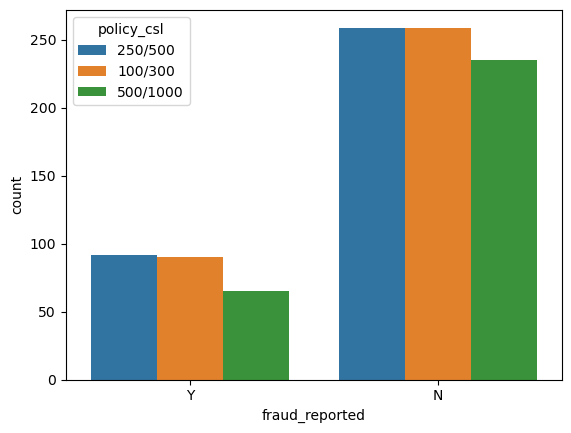

In [260]:
sns.countplot(x='fraud_reported',hue='policy_csl',data=df)

policy_csl 500/1000 has the least fraud claim.

<Axes: xlabel='fraud_reported', ylabel='count'>

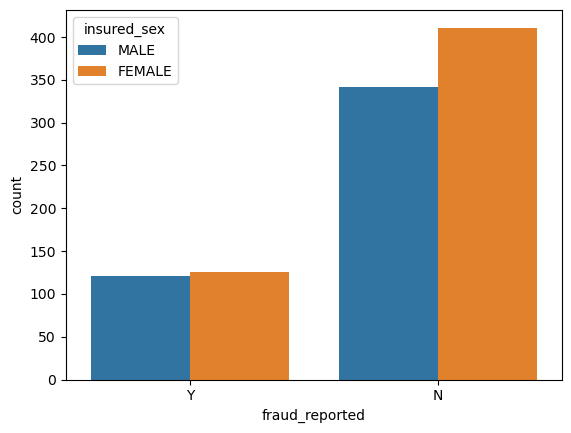

In [261]:
sns.countplot(x='fraud_reported',hue='insured_sex',data=df)

Females and males are more or less same in the fraud claim.

<Axes: xlabel='fraud_reported', ylabel='count'>

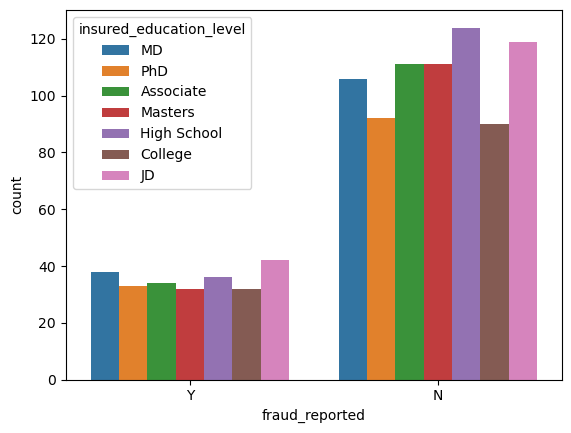

In [262]:
sns.countplot(x='fraud_reported',hue='insured_education_level',data=df)

Out of all, people having 'JD' and 'MD' education level have high fraud claims.

<Axes: xlabel='fraud_reported', ylabel='count'>

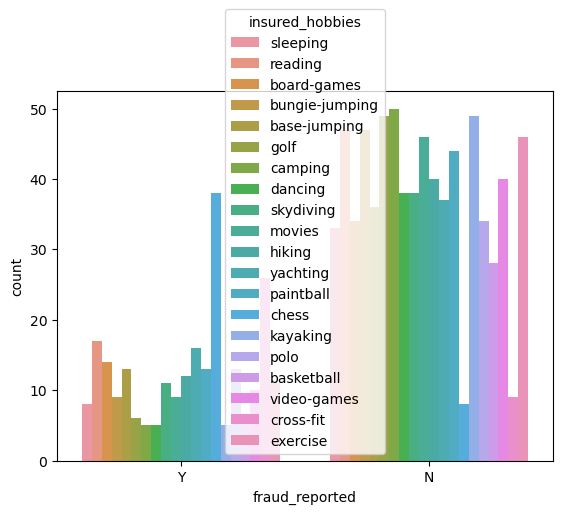

In [263]:
sns.countplot(x='fraud_reported',hue='insured_hobbies',data=df)

People who are having chess as a hobby have the highest fraud claims.

<Axes: xlabel='fraud_reported', ylabel='count'>

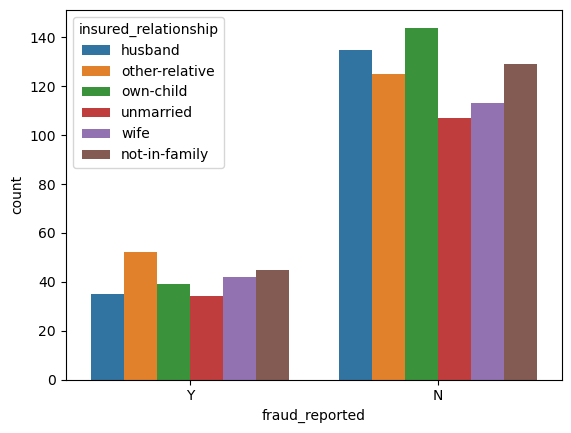

In [264]:
sns.countplot(x='fraud_reported',hue='insured_relationship',data=df)

Insured_relationship as other-realtive have the highest fraud claim.

<Axes: xlabel='fraud_reported', ylabel='count'>

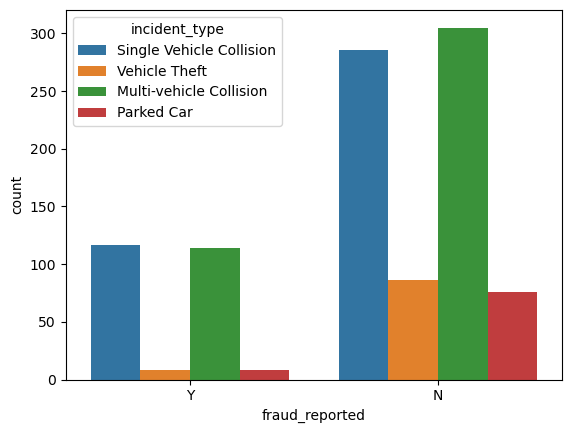

In [265]:
sns.countplot(x='fraud_reported',hue='incident_type',data=df)

Insurance Fraud claims more in Single and Multi Vehicle Collision.

<Axes: xlabel='fraud_reported', ylabel='count'>

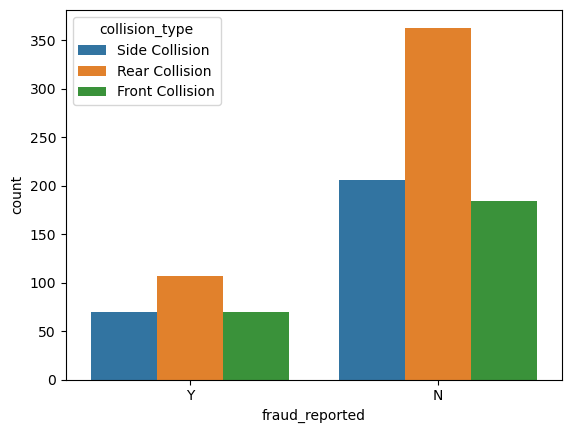

In [266]:
sns.countplot(x='fraud_reported',hue='collision_type',data=df)

<Axes: xlabel='fraud_reported', ylabel='count'>

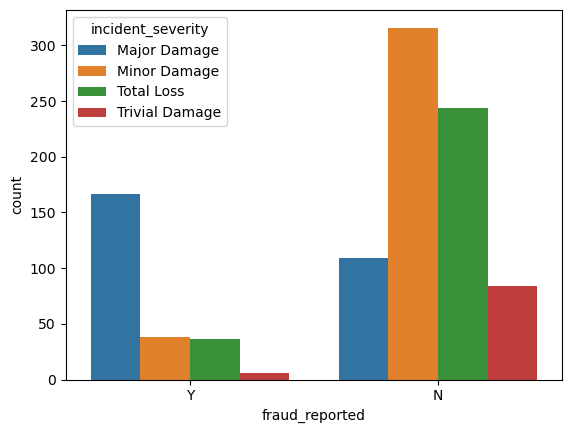

In [267]:
sns.countplot(x='fraud_reported',hue='incident_severity',data=df)

Incident severity as Major damage have the highest fraud claims out of all.

<Axes: xlabel='fraud_reported', ylabel='count'>

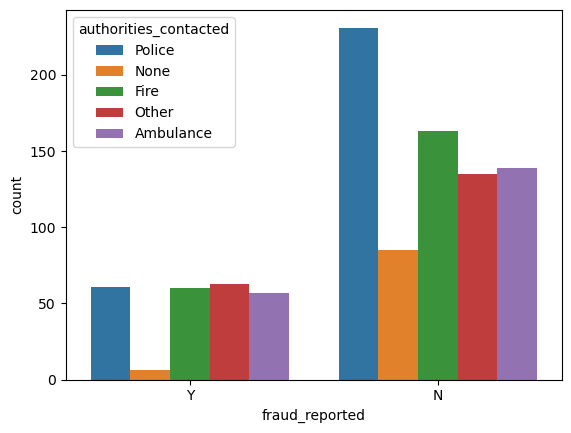

In [268]:
sns.countplot(x='fraud_reported',hue='authorities_contacted',data=df)

Incidents, when none of the authorities_contacted have the least fraud claims.

<Axes: xlabel='fraud_reported', ylabel='count'>

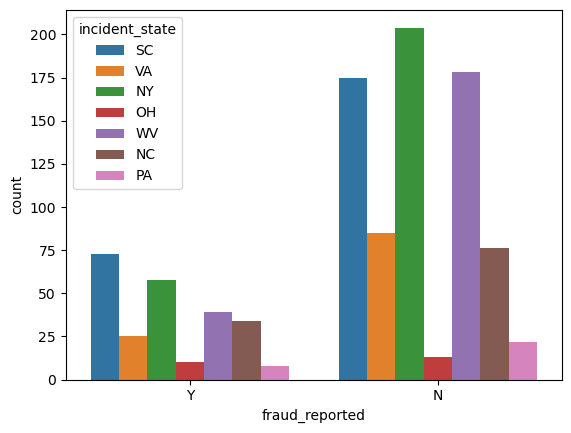

In [269]:
sns.countplot(x='fraud_reported',hue='incident_state',data=df)

Most of the fraud claims are from  incident states 'SC' and 'NY'.

<Axes: xlabel='fraud_reported', ylabel='count'>

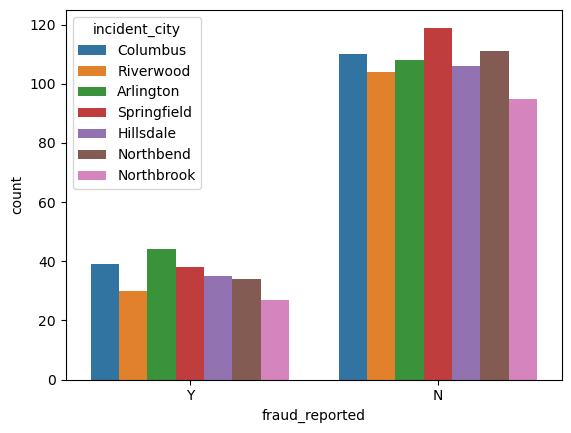

In [270]:
sns.countplot(x='fraud_reported',hue='incident_city',data=df)

Out of all incident cities, most fraud claim from Arlington city.

<Axes: xlabel='fraud_reported', ylabel='count'>

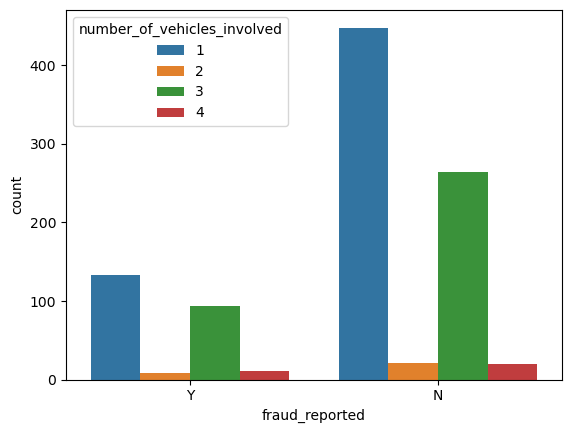

In [271]:
sns.countplot(x='fraud_reported',hue='number_of_vehicles_involved',data=df)

In most of the fraud claims, only one vehicle is involved.

<Axes: xlabel='fraud_reported', ylabel='count'>

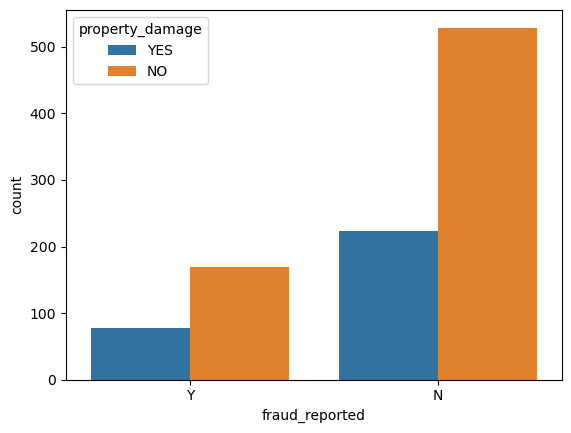

In [272]:
sns.countplot(x='fraud_reported',hue='property_damage',data=df)

In most fraud claims, there is no property damage.

<Axes: xlabel='fraud_reported', ylabel='count'>

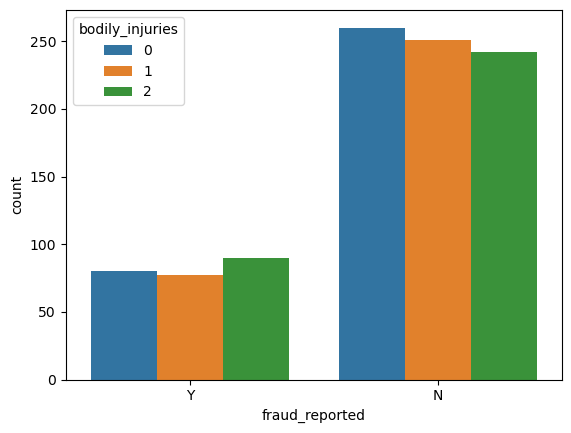

In [273]:
sns.countplot(x='fraud_reported',hue='bodily_injuries',data=df)

<Axes: xlabel='fraud_reported', ylabel='count'>

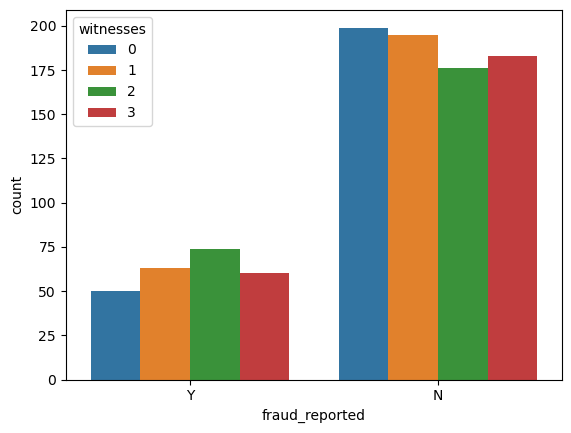

In [274]:
sns.countplot(x='fraud_reported',hue='witnesses',data=df)

In most fraud claiums, there are 2 witnesses.

<Axes: xlabel='fraud_reported', ylabel='count'>

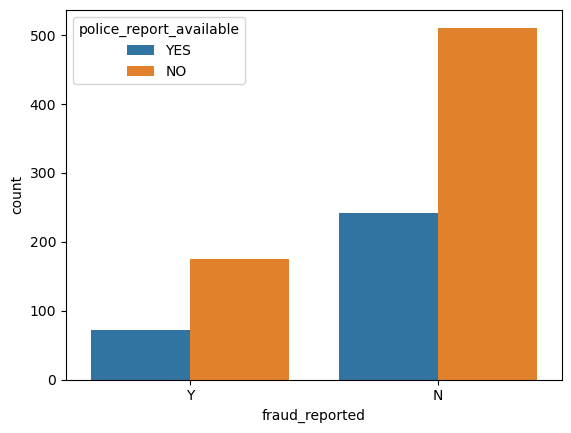

In [275]:
sns.countplot(x='fraud_reported',hue='police_report_available',data=df)

There is no police report available in most of the fraud claims.

<Axes: xlabel='fraud_reported', ylabel='count'>

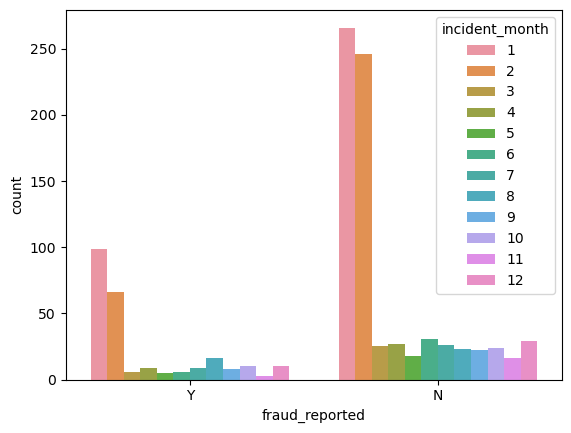

In [276]:
sns.countplot(x='fraud_reported',hue='incident_month',data=df)

In January and February most of the fraud claims happened.

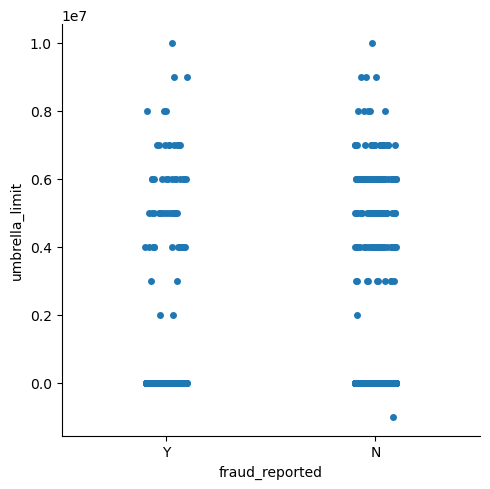

In [277]:
sns.catplot(x='fraud_reported',y='umbrella_limit', data=df)

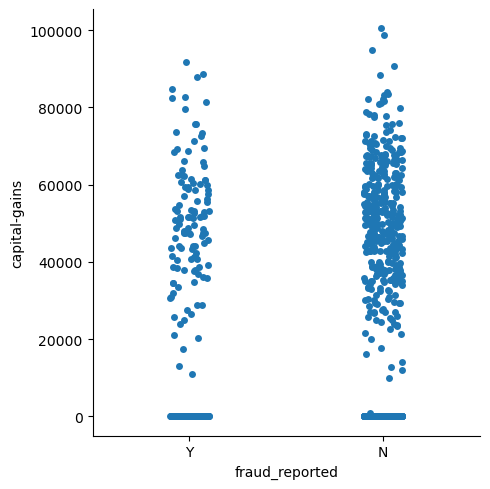

In [278]:
sns.catplot(x='fraud_reported',y='capital-gains', data=df)

Capital gains is more than 40000 in most of the fraud claims.

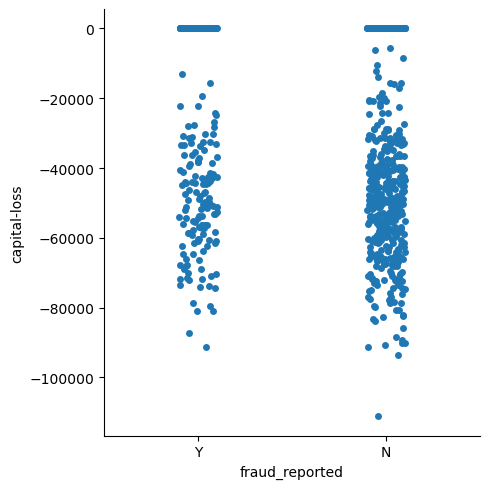

In [279]:
sns.catplot(x='fraud_reported',y='capital-loss', data=df)

Capital loss is more than 80000 in all fraud claims.

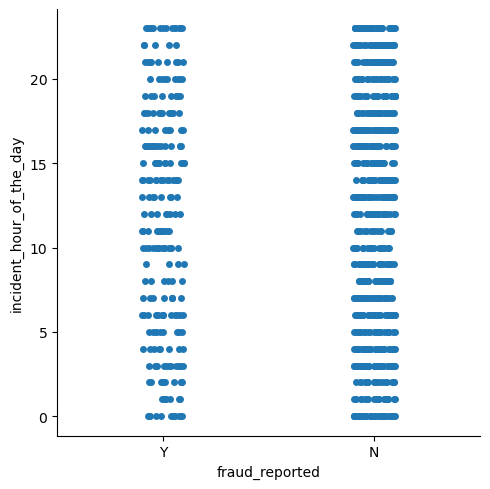

In [280]:
sns.catplot(x='fraud_reported',y='incident_hour_of_the_day', data=df)

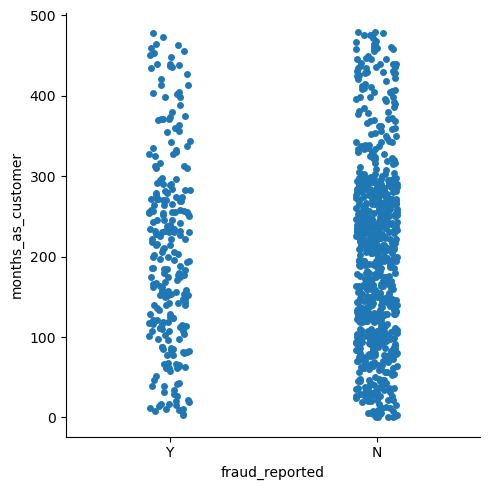

In [281]:
sns.catplot(x='fraud_reported',y='months_as_customer', data=df)

People who are 100 to 300 months as customer are having high fraud claims.

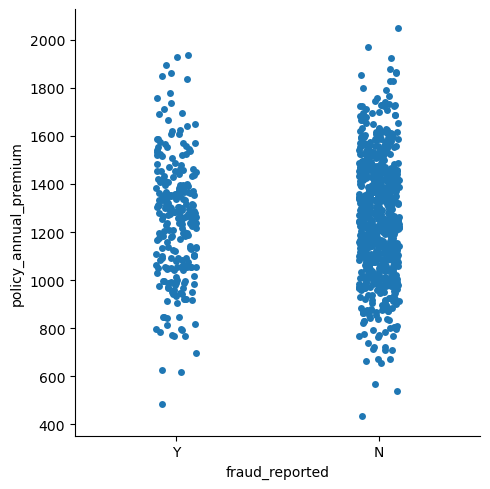

In [282]:
sns.catplot(x='fraud_reported',y='policy_annual_premium', data=df)

In most of the fraud claims policy annual premium is more than 1000.

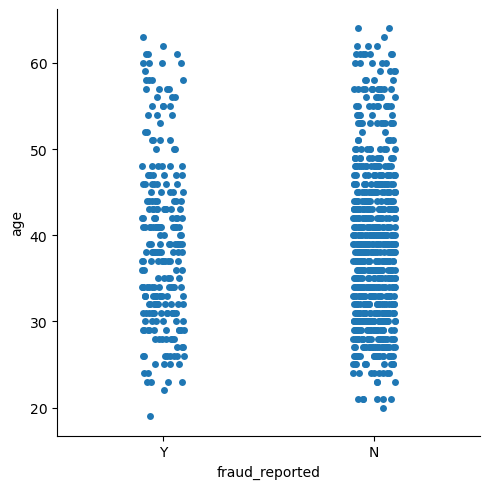

In [283]:
sns.catplot(x='fraud_reported',y='age', data=df)

From age 30 to 50 most fraud claims are reported.

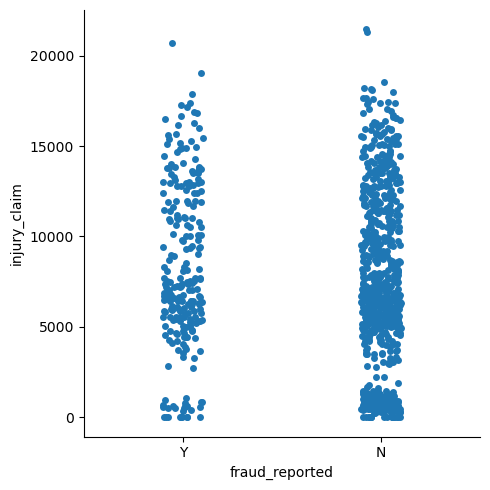

In [285]:
sns.catplot(x='fraud_reported',y='injury_claim', data=df)

In most the fraud calims, injury claim is more than 5000.

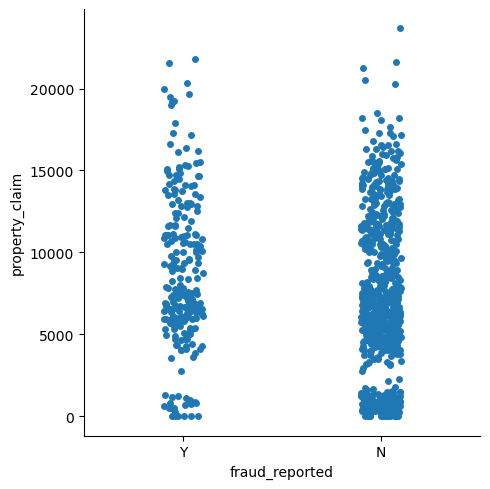

In [286]:
sns.catplot(x='fraud_reported',y='property_claim', data=df)

In most the fraud calims, property claim is more than 5000.

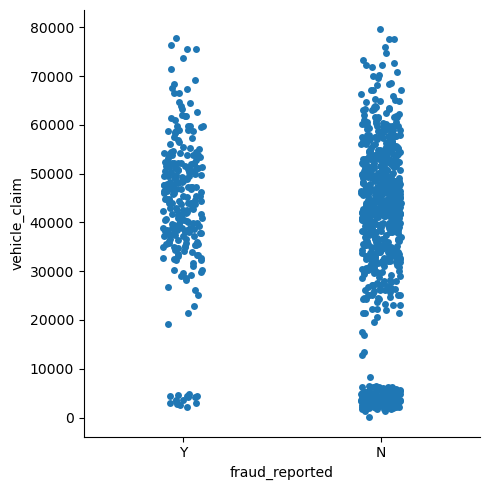

In [287]:
sns.catplot(x='fraud_reported',y='vehicle_claim', data=df)

In most the fraud calims, vehicle claim is more than 30000.

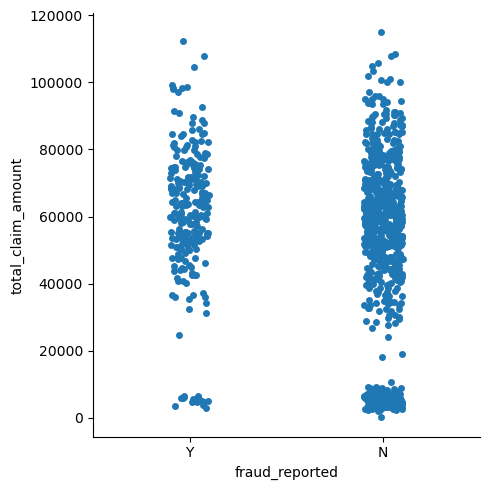

In [288]:
sns.catplot(x='fraud_reported',y='total_claim_amount', data=df)

In most the fraud calims, total calim amount is more than 40000.

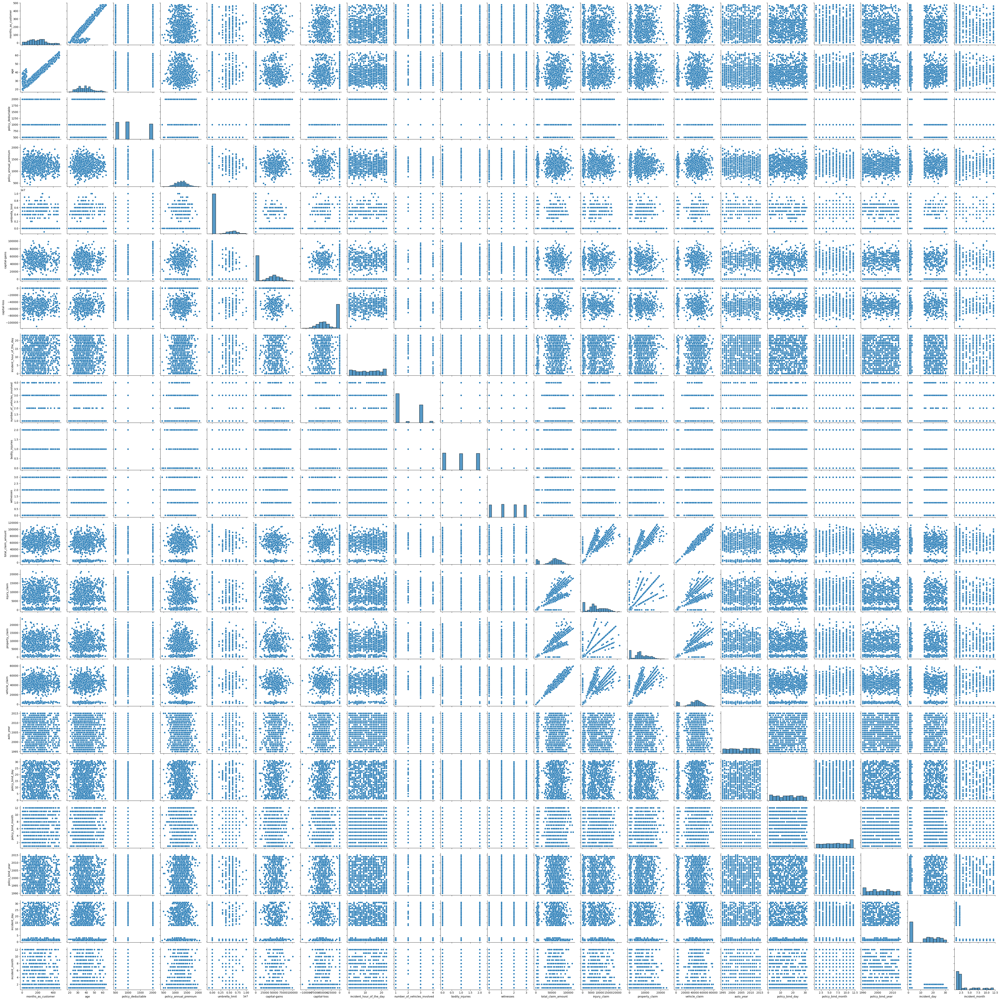

In [289]:
sns.pairplot(df)
plt.show()

In [290]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   object 
 3   policy_csl                   1000 non-null   object 
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_sex                  1000 non-null   object 
 8   insured_education_level      1000 non-null   object 
 9   insured_occupation           1000 non-null   object 
 10  insured_hobbies              1000 non-null   object 
 11  insured_relationship         1000 non-null   object 
 12  capital-gains                1000 non-null   int64  
 13  capital-loss       

# Encoding categorical column

Converting Categorical column to numerical

In [291]:
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i] = OE.fit_transform(df[i].values.reshape(-1,1))

In [292]:
df.sample(15)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month
454,126,30,0.0,1.0,2000,1171.75,0,0.0,0.0,6.0,...,39870,3.0,25.0,2011,0.0,10,6,2012,31,1
897,178,39,0.0,0.0,500,1035.99,0,0.0,3.0,3.0,...,41160,7.0,36.0,2010,0.0,3,8,2009,17,1
660,446,57,1.0,0.0,2000,1373.21,0,1.0,1.0,0.0,...,43960,7.0,36.0,2012,0.0,12,9,1992,14,2
697,145,37,2.0,1.0,2000,1434.27,0,0.0,0.0,12.0,...,40080,9.0,26.0,2002,0.0,14,12,1991,1,4
698,164,31,1.0,2.0,500,1114.68,0,0.0,0.0,7.0,...,3360,8.0,12.0,2002,0.0,31,1,2011,26,1
679,148,30,2.0,0.0,500,1471.24,0,0.0,5.0,4.0,...,24360,4.0,27.0,1997,0.0,13,4,2002,15,1
731,219,43,1.0,0.0,1000,1114.29,0,0.0,2.0,13.0,...,54540,12.0,18.0,2006,0.0,20,6,2002,1,8
347,257,43,1.0,2.0,2000,929.70,6000000,0.0,6.0,5.0,...,47430,8.0,12.0,2005,0.0,18,2,1999,14,1
357,110,28,2.0,1.0,1000,1573.93,0,1.0,1.0,7.0,...,43360,11.0,19.0,2010,0.0,13,7,2013,1,7
362,150,30,1.0,0.0,1000,1342.02,0,1.0,4.0,9.0,...,3600,10.0,2.0,1999,0.0,17,11,2004,28,2


In [293]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   float64
 3   policy_csl                   1000 non-null   float64
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_sex                  1000 non-null   float64
 8   insured_education_level      1000 non-null   float64
 9   insured_occupation           1000 non-null   float64
 10  insured_hobbies              1000 non-null   float64
 11  insured_relationship         1000 non-null   float64
 12  capital-gains                1000 non-null   int64  
 13  capital-loss       

We can see that all columns are in numerical/continous nature.

# Checking Correlation

In [294]:
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.060925,-0.000833,0.009814,...,0.061013,0.047655,0.004202,-0.000292,0.020544,0.051728,0.005750,-0.048276,-0.011092,0.024659
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.073337,0.000969,0.017220,...,0.062588,0.030410,0.017343,0.001354,0.012143,0.053869,0.015501,-0.037444,-0.006131,0.023404
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,-0.020481,-0.034327,-0.031215,...,0.001425,0.017124,-0.025253,0.002114,0.029432,0.002277,0.071450,-0.007276,0.014745,0.023643
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,-0.010757,0.009153,0.015788,...,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,0.018973,-0.045345,-0.016466,-0.004156,-0.011794
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,-0.009733,0.015217,-0.046733,...,0.005269,-0.035379,-0.003268,0.026105,0.014817,0.009164,-0.050416,-0.049598,-0.018160,-0.006418
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.038853,-0.019715,0.035922,...,0.020246,0.000045,-0.031849,-0.049226,-0.014480,-0.025183,-0.035355,0.001249,0.014835,0.021559
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.010688,-0.019357,0.023422,...,-0.038584,-0.004443,0.040256,0.009893,0.058622,-0.045207,0.009961,0.048008,-0.021716,0.042409
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,1.000000,0.009002,-0.006160,...,-0.029609,0.026457,-0.018421,-0.028247,0.030873,0.040713,-0.004033,-0.032891,-0.007280,0.024227
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.019357,0.009002,1.000000,-0.020298,...,0.068348,0.055202,0.049445,0.043509,0.008808,0.012610,-0.007118,0.018952,-0.058104,0.075083
insured_occupation,0.009814,0.017220,-0.031215,0.015788,-0.046733,0.035922,0.023422,-0.006160,-0.020298,1.000000,...,-0.000829,0.042621,0.020584,-0.006676,0.001564,-0.006432,0.026140,-0.027085,-0.022105,0.019403


<Axes: >

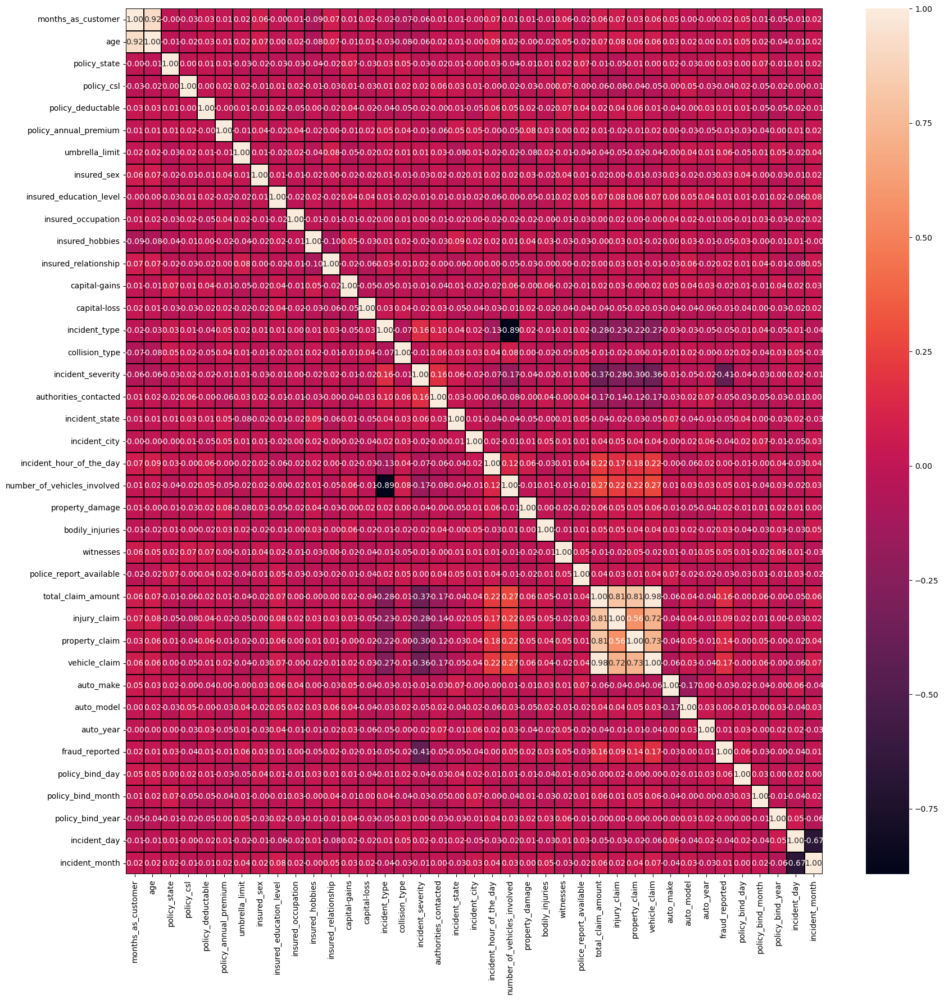

In [295]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True, linewidths=0.1, linecolor='black', fmt='0.2f')

From the above, we can see that

    1) The features 'Age' and 'months_as_customer' have very high positive correlation with each other.
    2) The features 'number_of_vehicles_involved' and 'incident_type' have very high negative correlation with each other.
    3) The features 'total_claim_amount', 'vehicle_claim', 'injury_claim' and 'property_claim' have very high positive correlation with each other.
    4) The target variable 'fraud_reported' has negative correlation with feature 'incident_severity'.

In [296]:
#'Age' and '#Dropping Age column' has high correlation
#Dropping Age column
df.drop(['age'], axis=1,inplace=True)

In [297]:
#correlation with target column(fraud_reported)
corr = df.corr()['fraud_reported'].abs().sort_values(ascending=False)
print(corr)

fraud_reported                 1.000000
incident_severity              0.405988
vehicle_claim                  0.170049
total_claim_amount             0.163651
property_claim                 0.137835
injury_claim                   0.090975
policy_bind_day                0.060643
umbrella_limit                 0.058622
number_of_vehicles_involved    0.051839
incident_state                 0.051407
incident_type                  0.050376
witnesses                      0.049497
insured_hobbies                0.046838
authorities_contacted          0.045802
incident_day                   0.044151
incident_city                  0.040403
policy_csl                     0.037190
bodily_injuries                0.033877
insured_sex                    0.030873
policy_bind_month              0.030829
policy_state                   0.029432
police_report_available        0.027768
auto_make                      0.027519
insured_relationship           0.021043
months_as_customer             0.020544


The columns 'insured_education_level', 'auto_year', 'incident_hour_of_the_day', 'insured_occupation', 'auto_model', 'policy_bind_year' have no correlation with our target variable, So we will drop it.

In [298]:
# dropping irrelevant columns
df.drop(columns=['auto_year','insured_education_level', 'incident_hour_of_the_day',
                 'insured_occupation', 'policy_bind_year',
                 'auto_model'],axis=1,inplace=True)

In [299]:
df.shape

(1000, 32)

# Checking Outliers

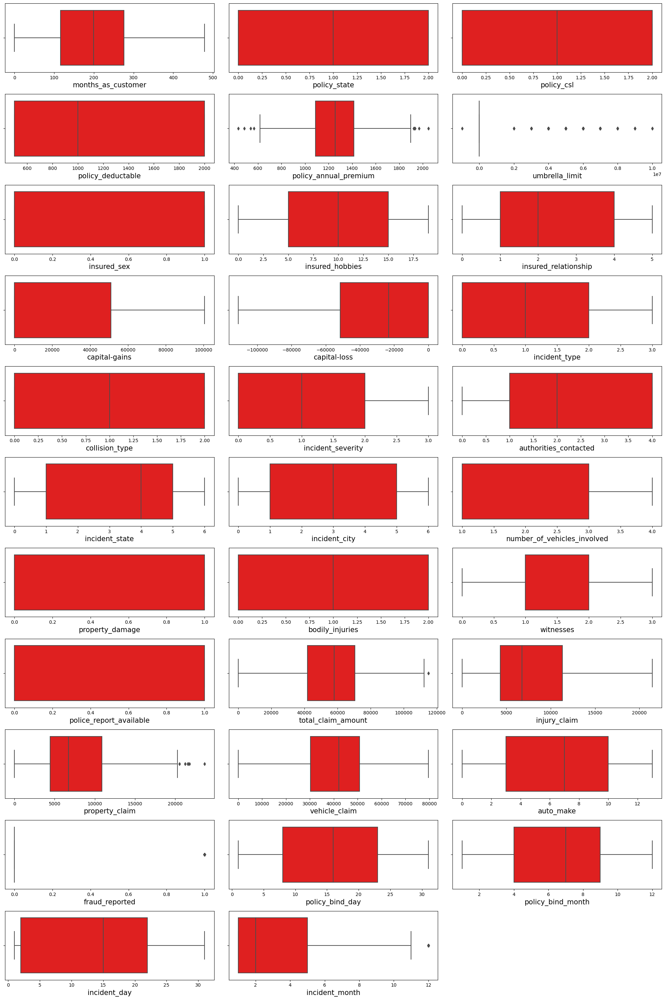

In [300]:
plt.figure(figsize=(20,30))
p=1
for i in df.columns:
    if p<=34:
        ax=plt.subplot(11,3,p)
        sns.boxplot(x=i, data=df,color='red')
        plt.xlabel(i,fontsize=15)
    p+=1
plt.tight_layout()

As, we can see that outliers are present

In [301]:
from scipy.stats import zscore
z=np.abs(zscore(df))
z

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_hobbies,insured_relationship,capital-gains,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,fraud_reported,policy_bind_day,policy_bind_month,incident_day,incident_month
0,1.078140,1.187173,0.060937,0.222383,0.616705,0.479476,1.076953,1.281737,1.437957,1.011331,...,0.714257,0.189283,1.165505,0.749653,0.856466,1.746019,0.175451,1.015026,1.141603,0.735040
1,0.208995,0.016856,0.060937,1.412784,0.242521,1.697980,1.076953,0.929078,0.247595,0.901927,...,1.807312,1.363822,1.372696,1.823346,0.360539,1.746019,1.305938,0.164894,0.758386,0.735040
2,0.608002,1.187173,1.182668,1.412784,0.642233,1.697980,0.928546,1.363201,0.347586,0.358023,...,0.686362,0.054644,0.736072,0.785565,0.631315,0.572731,0.728938,0.164894,0.854190,0.429664
3,0.452355,1.220886,0.060937,1.412784,0.652886,2.133471,0.928546,1.363201,0.942766,0.853388,...,0.403135,0.224130,0.219722,0.677607,0.879279,1.746019,1.079841,0.459874,1.157698,2.013343
4,0.208995,1.220886,1.304542,0.222383,1.341980,2.133471,1.076953,1.363201,0.942766,1.467210,...,1.753121,1.257232,1.399654,1.768252,1.623169,0.572731,1.068084,0.164894,0.375169,0.429664
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.746582,1.187173,1.304542,0.222383,0.222884,0.479476,0.928546,0.576420,0.942766,0.901927,...,1.305049,2.051155,0.273817,1.224309,0.135388,0.572731,0.062403,0.130086,0.854190,0.429664
996,0.704407,1.220886,1.182668,0.222383,0.739141,0.479476,0.928546,1.281737,1.537947,1.643100,...,2.111466,2.182342,2.214794,1.821868,1.600357,0.572731,1.633327,0.459874,1.045799,0.735040
997,0.642767,1.187173,0.060937,1.039966,0.520739,0.826998,0.928546,1.186872,0.247595,0.358023,...,0.558507,0.013648,0.020826,0.771902,1.104430,0.572731,0.175451,1.344813,0.949994,0.735040
998,2.208028,1.220886,1.304542,1.412784,0.411866,1.697980,1.076953,1.715859,1.537947,0.901927,...,0.219110,0.453708,0.451976,0.073580,1.375206,0.572731,0.288500,1.310006,1.237407,0.429664


In [302]:
# threshold =3
np.where(z>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 807, 875, 922, 975], dtype=int64),
 array([ 5,  5,  5,  5,  5,  4,  4,  5,  5,  5,  5, 24,  5,  5,  5,  4, 10,
         5,  5,  5], dtype=int64))

In [303]:
z.iloc[31,5]

3.0044538458871766

In [304]:
df_new=df[(z<3).all(axis=1)]
df_new

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_hobbies,insured_relationship,capital-gains,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,fraud_reported,policy_bind_day,policy_bind_month,incident_day,incident_month
0,328,2.0,1.0,1000,1406.91,0,1.0,17.0,0.0,53300,...,71610,6510,13020,52080,10.0,1.0,17,10,25,1
1,228,1.0,1.0,2000,1197.22,5000000,1.0,15.0,2.0,0,...,5070,780,780,3510,8.0,1.0,27,6,21,1
2,134,2.0,0.0,2000,1413.14,5000000,0.0,2.0,3.0,35100,...,34650,7700,3850,23100,4.0,0.0,9,6,22,2
3,256,0.0,1.0,2000,1415.74,6000000,0.0,2.0,4.0,48900,...,63400,6340,6340,50720,3.0,1.0,25,5,1,10
4,228,0.0,2.0,1000,1583.91,6000000,1.0,2.0,4.0,66000,...,6500,1300,650,4550,0.0,0.0,6,6,17,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,2.0,2.0,1000,1310.80,0,0.0,13.0,4.0,0,...,87200,17440,8720,61040,6.0,0.0,16,7,22,2
996,285,0.0,0.0,1000,1436.79,0,0.0,17.0,5.0,70900,...,108480,18080,18080,72320,13.0,0.0,1,5,24,1
997,130,2.0,1.0,500,1383.49,3000000,0.0,3.0,2.0,35100,...,67500,7500,7500,52500,11.0,0.0,17,2,23,1
998,458,0.0,2.0,2000,1356.92,5000000,1.0,0.0,5.0,0,...,46980,5220,5220,36540,1.0,0.0,18,11,26,2


In [305]:
df_new.shape

(980, 32)

In [306]:
df.shape

(1000, 32)

In [307]:
print("Data loss percentage = ",((df.shape[0]-df_new.shape[0])/df.shape[0])*100)

Data loss percentage =  2.0


In [308]:
df=df_new

In [309]:
df.shape

(980, 32)

# Checking Skewness

In [310]:
df.skew()

months_as_customer             0.362608
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_sex                    0.139324
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                -0.032778
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
number_of_vehicles_involved    0.509725
property_damage                0.853093
bodily_injuries                0.003757
witnesses                      0.026211
police_report_available        0.796221
total_claim_amount            -0.593593
injury_claim                   0.271759
property_claim                 0.361356


In [311]:
#Importing PowerTransformer
from sklearn.preprocessing import PowerTransformer

# Columns to be transformed
skew_columns = ['vehicle_claim', 'incident_month', 'total_claim_amount']

scaler = PowerTransformer(method='yeo-johnson')
df[skew_columns] = scaler.fit_transform(df[skew_columns].values)

# Checking Skewness after treating skewness
df.skew()

months_as_customer             0.362608
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_sex                    0.139324
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                -0.032778
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
number_of_vehicles_involved    0.509725
property_damage                0.853093
bodily_injuries                0.003757
witnesses                      0.026211
police_report_available        0.796221
total_claim_amount            -0.508540
injury_claim                   0.271759
property_claim                 0.361356


For 'umbrella_limit' column, if we use any method, it will again increase the skewness, so keep as it is.

For target variables and Categorical datas, no need to remove skewness.

# Splitting target variable

In [312]:
x = df.drop("fraud_reported", axis = 1)
y= df['fraud_reported']

In [313]:
x

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_hobbies,insured_relationship,capital-gains,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,policy_bind_day,policy_bind_month,incident_day,incident_month
0,328,2.0,1.0,1000,1406.91,0,1.0,17.0,0.0,53300,...,1.0,0.720163,6510,13020,0.758130,10.0,17,10,25,-1.100637
1,228,1.0,1.0,2000,1197.22,5000000,1.0,15.0,2.0,0,...,0.0,-1.778146,780,780,-1.787485,8.0,27,6,21,-1.100637
2,134,2.0,0.0,2000,1413.14,5000000,0.0,2.0,3.0,35100,...,0.0,-0.715924,7700,3850,-0.820246,4.0,9,6,22,-0.021968
3,256,0.0,1.0,2000,1415.74,6000000,0.0,2.0,4.0,48900,...,0.0,0.395030,6340,6340,0.681832,3.0,25,5,1,1.557258
4,228,0.0,2.0,1000,1583.91,6000000,1.0,2.0,4.0,66000,...,0.0,-1.730904,1300,650,-1.740862,0.0,6,6,17,-0.021968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,2.0,2.0,1000,1310.80,0,0.0,13.0,4.0,0,...,0.0,1.344950,17440,8720,1.265008,6.0,16,7,22,-0.021968
996,285,0.0,0.0,1000,1436.79,0,0.0,17.0,5.0,70900,...,0.0,2.210977,18080,18080,1.912437,13.0,1,5,24,-1.100637
997,130,2.0,1.0,500,1383.49,3000000,0.0,3.0,2.0,35100,...,1.0,0.557034,7500,7500,0.781728,11.0,17,2,23,-1.100637
998,458,0.0,2.0,2000,1356.92,5000000,1.0,0.0,5.0,0,...,1.0,-0.245515,5220,5220,-0.102017,1.0,18,11,26,-0.021968


In [314]:
y

0      1.0
1      1.0
2      0.0
3      1.0
4      0.0
      ... 
995    0.0
996    0.0
997    0.0
998    0.0
999    0.0
Name: fraud_reported, Length: 980, dtype: float64

# To remove biasness, we use Standard scaler method

In [315]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_hobbies,insured_relationship,capital-gains,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,policy_bind_day,policy_bind_month,incident_day,incident_month
0,1.069568,1.179821,0.067231,-0.224643,0.620031,-0.467878,1.071971,1.275279,-1.437247,1.003849,...,1.473608,0.720163,-0.187627,1.176015,0.758130,0.851959,0.174693,1.013473,1.142661,-1.100637
1,0.202726,-0.024580,0.067231,1.412161,-0.248448,1.890767,1.071971,0.923775,-0.248136,-0.906228,...,-0.678606,-1.778146,-1.361005,-1.378984,-1.787485,0.355279,1.308458,-0.162612,0.758573,-1.100637
2,-0.612105,1.179821,-1.175916,1.412161,0.645834,1.890767,-0.932861,-1.361003,0.346420,0.351628,...,-0.678606,-0.715924,0.056059,-0.738147,-0.820246,-0.638083,-0.732320,-0.162612,0.854595,-0.021968
3,0.445442,-1.228980,0.067231,1.412161,0.656603,2.362496,-0.932861,-1.361003,0.940975,0.846169,...,-0.678606,0.395030,-0.222439,-0.218380,0.681832,-0.886423,1.081705,-0.456633,-1.161866,1.557258
4,0.202726,-1.228980,1.310379,-0.224643,1.353117,2.362496,1.071971,-1.361003,0.940975,1.458971,...,-0.678606,-1.730904,-1.254521,-1.406121,-1.740862,-1.631444,-1.072450,-0.162612,0.374486,-0.021968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-1.747669,1.179821,1.310379,-0.224643,0.221970,-0.467878,-0.932861,0.572270,0.940975,-0.906228,...,-0.678606,1.344950,2.050597,0.278425,1.265008,-0.141402,0.061316,0.131409,0.854595,-0.021968
976,0.696826,-1.228980,-1.175916,-0.224643,0.743786,-0.467878,-0.932861,1.275279,1.535531,1.634569,...,-0.678606,2.210977,2.181655,2.232248,1.912437,1.596980,-1.639333,-0.456633,1.046639,-1.100637
977,-0.646779,1.179821,0.067231,-1.043045,0.523032,0.947309,-0.932861,-1.185251,-0.248136,0.351628,...,1.473608,0.557034,0.015103,0.023760,0.781728,1.100300,0.174693,-1.338696,0.950617,-1.100637
978,2.196463,-1.228980,1.310379,1.412161,0.412986,1.890767,1.071971,-1.712507,1.535531,-0.906228,...,1.473608,-0.245515,-0.451791,-0.452171,-0.102017,-1.383104,0.288069,1.307494,1.238683,-0.021968


# Checking multicollinearity

In [316]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif["features"] = x.columns

vif

,VIF values,features
0,1.045652,months_as_customer
1,1.033757,policy_state
2,1.029502,policy_csl
3,1.038105,policy_deductable
4,1.032750,policy_annual_premium
5,1.039031,umbrella_limit
6,1.026605,insured_sex
7,1.045521,insured_hobbies
8,1.049202,insured_relationship
9,1.033046,capital-gains


In [318]:
# dropping  columns
x.drop(columns=['property_claim','injury_claim', 'total_claim_amount'],axis=1,inplace=True)

In [319]:
#Checking Again
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif["features"] = x.columns

vif

,VIF values,features
0,1.041537,months_as_customer
1,1.030575,policy_state
2,1.023198,policy_csl
3,1.025624,policy_deductable
4,1.029085,policy_annual_premium
5,1.038260,umbrella_limit
6,1.022459,insured_sex
7,1.039593,insured_hobbies
8,1.045512,insured_relationship
9,1.031700,capital-gains


Now, we can see that collineraity has been removed between features.

In [320]:
x.shape

(980, 28)

# Balancing dataset

In [321]:
y.value_counts()

0.0    740
1.0    240
Name: fraud_reported, dtype: int64

Here, we can see that data is not balanced. Since it is a classification problem, we will balance the data using oversampling method

In [322]:
import sklearn
from imblearn.over_sampling import SMOTE
SME = SMOTE()
x1,y1 = SME.fit_resample(x,y)

In [323]:
y1.value_counts()

1.0    740
0.0    740
Name: fraud_reported, dtype: int64

Now, the dataset is balanced, we can go for model building.

# Model Building

Finding the best random state.

In [326]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
maxAcc = 0
maxRS= 0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred = RFC.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRS = i
        
print("The best accuracy is ", maxAcc, "at random state ", maxRS)

The best accuracy is  0.9121621621621622 at random state  123


Train Test Split

In [327]:
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=maxRS)

# Classification Algorithms

In [328]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve

In [329]:
#Creating a list for models
LR = LogisticRegression()
KNN = KNeighborsClassifier()
DTC = DecisionTreeClassifier()
RFC = RandomForestClassifier()
ETC = ExtraTreesClassifier()
GBC = GradientBoostingClassifier()
ABC = AdaBoostClassifier()
BC = BaggingClassifier()
GNB = GaussianNB()
SV = SVC()

models = [LR, KNN, DTC, RFC, ETC, GBC, ABC, BC, GNB, SV]

# Accuracy and CV score for all Classification Models.

In [330]:
for i in models:
    print(i)
    print("------------------------")
    i.fit(x_train,y_train)
    pred = i.predict(x_test)
    print("Accuracy for ",i,"model is ", accuracy_score(y_test,pred)*100)
    print(confusion_matrix(y_test,pred))
    print(classification_report(y_test,pred))
    print("Cross Validation:")
    print("-----------------")
    cv_score = cross_val_score(i,x1,y1)
    print("CV Scores are : ",cv_score)
    print("CV Score mean : ",cv_score.mean())
    print("Difference between Accuracy score and CV score is ", accuracy_score(y_test,pred) - cv_score.mean())
    print('\n\n')

LogisticRegression()
------------------------
Accuracy for  LogisticRegression() model is  76.8018018018018
[[171  60]
 [ 43 170]]
              precision    recall  f1-score   support

         0.0       0.80      0.74      0.77       231
         1.0       0.74      0.80      0.77       213

    accuracy                           0.77       444
   macro avg       0.77      0.77      0.77       444
weighted avg       0.77      0.77      0.77       444

Cross Validation:
-----------------
CV Scores are :  [0.71959459 0.74324324 0.71283784 0.75675676 0.7972973 ]
CV Score mean :  0.745945945945946
Difference between Accuracy score and CV score is  0.02207207207207207



KNeighborsClassifier()
------------------------
Accuracy for  KNeighborsClassifier() model is  67.7927927927928
[[ 95 136]
 [  7 206]]
              precision    recall  f1-score   support

         0.0       0.93      0.41      0.57       231
         1.0       0.60      0.97      0.74       213

    accuracy            

Extra Trees Classifier is our best model because Accuracy score and CV Score is high and difference between Accuracy score and CV score is least

# Extra Trees Classifier is our best model

# Hyper Parameter Tuning

In [331]:
#Using Grid Search CV on Extra Trees Classifier

from sklearn.model_selection import GridSearchCV

parameters = {'criterion' : ['gini', 'entropy', 'log_loss'],
              'n_estimators' : [50, 100, 200],
              'max_depth' : [0, 10, 20],
              'max_features': ['auto', 'sqrt'],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4]}

In [332]:
GCV = GridSearchCV(ExtraTreesClassifier(), parameters, cv = 5 )

In [333]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [0, 10, 20],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]})

In [334]:
Best_Parameters = GCV.best_params_
print(Best_Parameters)

{'criterion': 'entropy', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}


# Finding best random state for our best model.

In [335]:
maxAcc = 0
maxRS= 0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    ETC = ExtraTreesClassifier()
    ETC.fit(x_train,y_train)
    pred = ETC.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRS = i
        
print("The best accuracy is ", maxAcc, "at random state ", maxRS)

The best accuracy is  0.9346846846846847 at random state  187


# Building Final model using best parameters

In [336]:
Final_model= ExtraTreesClassifier(criterion = 'entropy', max_depth = 20, n_estimators = 50, max_features ='sqrt', min_samples_split = 2 , min_samples_leaf = 1)
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=187)
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
Accuracy = accuracy_score(y_test,pred)
print("Accuracy is ", Accuracy*100 )
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy is  92.56756756756756
[[196  12]
 [ 21 215]]
              precision    recall  f1-score   support

         0.0       0.90      0.94      0.92       208
         1.0       0.95      0.91      0.93       236

    accuracy                           0.93       444
   macro avg       0.93      0.93      0.93       444
weighted avg       0.93      0.93      0.93       444



# The accuracy for our best model is 92%

# Saving the best model

In [339]:
import joblib
joblib.dump(Final_model, "Insurance_fraud_Prediction.pkl")

['Insurance_fraud_Prediction.pkl']

# Loading and Prediction

In [340]:
import joblib
model= joblib.load("Insurance_fraud_Prediction.pkl")

In [341]:
prediction=pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted value","original value"])

In [342]:
prediction

,0,1,2,3,4,5,6,7,8,9,...,434,435,436,437,438,439,440,441,442,443
Predicted value,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
original value,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


# Plotting AUC - ROC Curve

In [343]:
from sklearn import metrics

In [344]:
fpr, tpr, thresholds = metrics.roc_curve(y_test,pred)
roc_auc = metrics.auc(fpr, tpr)

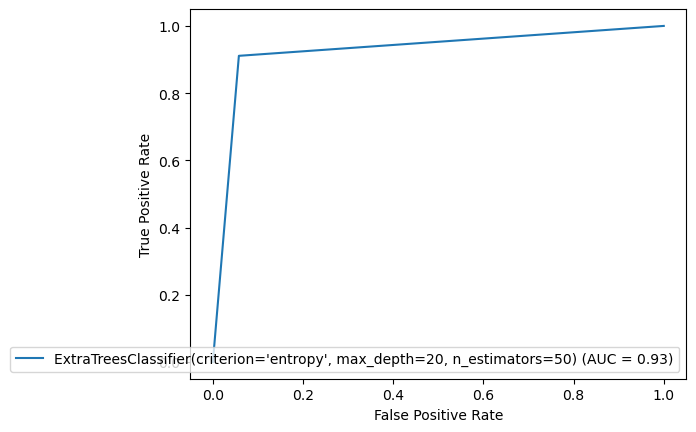

In [345]:
curve = metrics.RocCurveDisplay(fpr=fpr, tpr= tpr, roc_auc= roc_auc, estimator_name=Final_model)
curve.plot()